In [1]:
#import important libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report ,roc_auc_score, roc_curve
from sklearn.preprocessing import LabelEncoder
import plotly.express as px
import plotly.graph_objects as go
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier  
from sklearn.metrics import accuracy_score  
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.ensemble import BalancedRandomForestClassifier
from scipy.stats import chi2_contingency, f_oneway
from sklearn.model_selection import train_test_split, GridSearchCV
import lightgbm as lgb
from sklearn.model_selection import learning_curve
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LinearRegression







In [4]:
#read the  dataset
df=pd.read_csv(r"C:\Users\arwah\OneDrive\Desktop\HealthCare Project\datasets\liver_cirrhosis.csv")
df.head(9)

,Patient_ID,N_Days_of suffering,Drug,Age_in days,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage_of_disease
0,1,2221,Placebo,18499,F,N,Y,N,N,0.5,149.000000,4.04,227.0,598.0,52.70,57.000000,256.0,9.9,1
1,2,1230,Placebo,19724,M,Y,N,Y,N,0.5,219.000000,3.93,22.0,663.0,45.00,75.000000,220.0,10.8,2
2,3,4184,Placebo,11839,F,N,N,N,N,0.5,320.000000,3.54,51.0,1243.0,122.45,80.000000,225.0,10.0,2
3,4,2090,Placebo,16467,F,N,N,N,N,0.7,255.000000,3.74,23.0,1024.0,77.50,58.000000,151.0,10.2,2
4,5,2105,Placebo,21699,F,N,Y,N,N,1.9,486.000000,3.54,74.0,1052.0,108.50,109.000000,151.0,11.5,1
5,6,4427,Placebo,16418,F,N,N,N,N,1.9,259.000000,3.70,281.0,10396.8,188.34,178.000000,327.0,10.4,2
6,7,1418,Placebo,23011,F,Y,N,Y,N,1.3,291.000000,3.44,75.0,1082.0,85.00,195.000000,156.0,10.3,2
7,8,51,Placebo,24107,F,Y,N,Y,Y,12.6,200.000000,2.74,140.0,918.0,147.25,143.000000,150.0,11.1,3
8,9,2504,Placebo,15265,F,N,N,N,N,2.3,369.510563,3.93,24.0,1828.0,133.30,124.702128,474.0,10.9,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Patient_ID           25000 non-null  int64  
 1   N_Days_of suffering  25000 non-null  int64  
 2   Drug                 25000 non-null  object 
 3   Age_in days          25000 non-null  int64  
 4   Sex                  25000 non-null  object 
 5   Ascites              25000 non-null  object 
 6   Hepatomegaly         25000 non-null  object 
 7   Spiders              25000 non-null  object 
 8   Edema                25000 non-null  object 
 9   Bilirubin            25000 non-null  float64
 10  Cholesterol          25000 non-null  float64
 11  Albumin              25000 non-null  float64
 12  Copper               25000 non-null  float64
 13  Alk_Phos             25000 non-null  float64
 14  SGOT                 25000 non-null  float64
 15  Tryglicerides        25000 non-null 

In [6]:
df.shape

(25000, 19)

In [7]:
df.describe()

,Patient_ID,N_Days_of suffering,Age_in days,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage_of_disease
count,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.00000
mean,12500.500000,1887.117040,18495.877080,3.402644,372.331471,3.486578,100.184663,1995.675597,123.166345,123.822548,256.007337,10.734549,2.00116
std,7217.022701,1091.690918,3737.596616,4.707491,193.668452,0.380488,73.184840,1798.885660,47.747616,52.786350,98.679006,0.904436,0.81387
min,1.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.00000
25%,6250.750000,1080.000000,15694.000000,0.800000,275.000000,3.290000,52.000000,1032.000000,92.000000,92.000000,189.000000,10.000000,1.00000
50%,12500.500000,1680.000000,18499.000000,1.300000,369.510563,3.510000,97.648387,1828.000000,122.556346,124.702128,251.000000,10.600000,2.00000
75%,18750.250000,2576.000000,20955.000000,3.400000,369.510563,3.750000,107.000000,1982.655769,134.850000,127.000000,311.000000,11.100000,3.00000
max,25000.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,721.000000,18.000000,3.00000


In [8]:
count1 = df[df['Sex'] == "M"].shape[0]
print(count1)
count2= df[df['Sex'] == "F"].shape[0]
print(count2)
# count3=df[df['gender'] == "Other"].shape[0]
# print(count3)
count1+count2


2863
22137


25000

In [ ]:
# df = df[df["gender"] != "Other"]


In [9]:
count1= df[df['Stage_of_disease'] == 1].shape[0]
count2= df[df['Stage_of_disease'] == 2].shape[0]
count3= df[df['Stage_of_disease'] == 3].shape[0]
count1+count2+count3


25000

In [10]:
count1= df[df['Edema'] == "N"].shape[0]
count2= df[df['Edema'] == "Y"].shape[0]
count1+count2

21302

In [11]:
df["Edema"].value_counts()

Edema
N    20220
S     3698
Y     1082
Name: count, dtype: int64

In [12]:
count1= df[df['Ascites'] == "N"].shape[0]
count2= df[df['Ascites'] == "Y"].shape[0]
count1+count2

25000

In [43]:
count1= df[df['Hepatomegaly'] == "N"].shape[0]
count2= df[df['Hepatomegaly'] == "Y"].shape[0]
count1+count2

25000

In [44]:
df["Spiders"].value_counts()

Spiders
N    13614
Y    11386
Name: count, dtype: int64

In [59]:
#check dublicates
duplicated_data=df.duplicated()
print(duplicated_data)


0        False
1        False
2        False
3        False
4        False
         ...  
24995    False
24996    False
24997    False
24998    False
24999    False
Length: 25000, dtype: bool


In [46]:
duplicates = df[df.duplicated(keep=False)]
print(duplicates)

Empty DataFrame
Columns: [Patient_ID, N_Days_of suffering, Drug, Age_in days, Sex, Ascites, Hepatomegaly, Spiders, Edema, Bilirubin, Cholesterol, Albumin, Copper, Alk_Phos, SGOT, Tryglicerides, Platelets, Prothrombin, Stage_of_disease]
Index: []


In [47]:
df.duplicated().sum()

0

In [ ]:
# #remove duplicates if exists
# df.drop_duplicates(inplace=True)
# df.duplicated().sum()

0

In [48]:
#check null values
df.isna()
rows_with_nan = df[df.isna().any(axis=1)]
print(rows_with_nan)



Empty DataFrame
Columns: [Patient_ID, N_Days_of suffering, Drug, Age_in days, Sex, Ascites, Hepatomegaly, Spiders, Edema, Bilirubin, Cholesterol, Albumin, Copper, Alk_Phos, SGOT, Tryglicerides, Platelets, Prothrombin, Stage_of_disease]
Index: []


In [49]:
df.isna().sum()

Patient_ID             0
N_Days_of suffering    0
Drug                   0
Age_in days            0
Sex                    0
Ascites                0
Hepatomegaly           0
Spiders                0
Edema                  0
Bilirubin              0
Cholesterol            0
Albumin                0
Copper                 0
Alk_Phos               0
SGOT                   0
Tryglicerides          0
Platelets              0
Prothrombin            0
Stage_of_disease       0
dtype: int64

In [60]:
print(df.columns)


Index(['Patient_ID', 'N_Days_of suffering', 'Drug', 'Age_in days', 'Sex',
       'Ascites', 'Hepatomegaly', 'Spiders', 'Edema', 'Bilirubin',
       'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides',
       'Platelets', 'Prothrombin', 'Stage_of_disease'],
      dtype='object')


In [51]:
df.nunique()

Patient_ID             25000
N_Days_of suffering      549
Drug                       2
Age_in days              510
Sex                        2
Ascites                    2
Hepatomegaly               2
Spiders                    2
Edema                      3
Bilirubin                113
Cholesterol              220
Albumin                  179
Copper                   197
Alk_Phos                 336
SGOT                     240
Tryglicerides            157
Platelets                295
Prothrombin               51
Stage_of_disease           3
dtype: int64

In [ ]:
#Identify  inconsistencies

print(df['Age'].unique())


In [61]:
df['Age']=round(df['Age_in days']/365)
df['N_Years_of suffering'] = round(df['N_Days_of suffering']/365)
df.drop(['N_Days_of suffering'],axis=1,inplace=True)

In [63]:
df.drop(["Age_in days"],axis=1,inplace=True)

In [64]:
df

,Patient_ID,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage_of_disease,Age,N_Years_of suffering
0,1,Placebo,F,N,Y,N,N,0.5,149.000000,4.04,227.0,598.0,52.70,57.000000,256.0,9.9,1,51.0,6.0
1,2,Placebo,M,Y,N,Y,N,0.5,219.000000,3.93,22.0,663.0,45.00,75.000000,220.0,10.8,2,54.0,3.0
2,3,Placebo,F,N,N,N,N,0.5,320.000000,3.54,51.0,1243.0,122.45,80.000000,225.0,10.0,2,32.0,11.0
3,4,Placebo,F,N,N,N,N,0.7,255.000000,3.74,23.0,1024.0,77.50,58.000000,151.0,10.2,2,45.0,6.0
4,5,Placebo,F,N,Y,N,N,1.9,486.000000,3.54,74.0,1052.0,108.50,109.000000,151.0,11.5,1,59.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,24996,D-penicillamine,F,N,N,N,N,0.8,231.000000,3.87,173.0,9009.8,127.71,96.000000,295.0,11.0,2,65.0,10.0
24996,24997,D-penicillamine,F,N,N,N,N,0.8,231.000000,3.87,173.0,9009.8,127.71,96.000000,295.0,11.0,2,65.0,10.0
24997,24998,D-penicillamine,F,N,Y,Y,Y,5.1,369.510563,3.23,18.0,790.0,179.80,124.702128,104.0,13.0,3,46.0,3.0
24998,24999,D-penicillamine,F,N,Y,N,N,0.8,315.000000,4.24,13.0,1637.0,170.50,70.000000,426.0,10.9,2,47.0,10.0


In [67]:
from tabulate import tabulate
unique_values_table = []

for column in df.columns:
    unique_values = df[column].unique()  
    unique_values_table.append([column, ", ".join(map(str, unique_values))])  

print(tabulate(unique_values_table, headers=["Column", "Unique Values"], tablefmt="grid"))


+----------------------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
# print(df['Age'].unique())

[51. 54. 32. 45. 59. 63. 66. 42. 61. 31. 46. 44. 50. 48. 69. 41. 37. 35.
 49. 75. 39. 29. 53. 47. 36. 52. 40. 43. 56. 78. 55. 73. 34. 67. 60. 68.
 62. 26. 64. 38. 33. 58. 70. 65. 57. 72. 71. 30. 77. 28.]


In [ ]:
# print(df['Drug'].unique())
# print(df['bmi'].unique())


['Placebo' 'D-penicillamine']


In [ ]:
# print(df['blood_glucose_level'].unique())
# print("\n")
# #scale 0 to 10
# print(df["eating sugar"].unique())
# print("\n")
# print(df["drink coffee"].unique())

[135  85 163 165 160  95 195 150  90 105 125 205 170 136 210 154 100 140
 145 131 255 155 169 164 110 168 225 295  75  80 285 290 153 310 121 265
 230 270 250 305 275 235 215 245]


[ 0  6  4  3  9  2  7  5  1 10  8]


[ 1  2  7  5 10  0  4  8  6  3  9]


In [69]:
df.columns

Index(['Patient_ID', 'Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders',
       'Edema', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos',
       'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin', 'Stage_of_disease',
       'Age', 'N_Years_of suffering'],
      dtype='object')

In [71]:
import plotly.express as px
import pandas as pd

# 🔹 توزيع العمر مقابل مرحلة المرض
fig_age = px.histogram(df, x="Age", color="Stage_of_disease", nbins=30, 
                       title="Age Distribution by Disease Stage",
                       color_discrete_sequence=px.colors.qualitative.Vivid, 
                       marginal="box")

# 🔹 تأثير الجنس على المرحلة المرضية
fig_sex = px.bar(df, x="Sex", color="Stage_of_disease", title="Disease Stage by Sex",
                 barmode="group", color_discrete_sequence=px.colors.qualitative.Set2)

# 🔹 عدد سنوات المعاناة مقابل المرحلة المرضية
fig_suffering = px.line(df, x="N_Years_of suffering", y="Stage_of_disease", 
                        title="Years of Suffering vs Disease Stage",
                        markers=True, color_discrete_sequence=["red"])

# 🔹 تأثير البيليروبين على المرض (Box Plot)
fig_bilirubin = px.box(df, x="Stage_of_disease", y="Bilirubin", 
                       title="Bilirubin Levels by Disease Stage",
                       color="Stage_of_disease", color_discrete_sequence=px.colors.qualitative.Plotly)

# 🔹 توزيع الألبومين حسب مرحلة المرض (Violin Plot)
fig_albumin = px.violin(df, x="Stage_of_disease", y="Albumin", box=True, points="all",
                        title="Albumin Levels Distribution by Disease Stage",
                        color="Stage_of_disease", color_discrete_sequence=px.colors.qualitative.Dark24)

# 🔹 تحليل الصفائح الدموية وتأثيرها على المرض (Scatter Plot)
fig_platelets = px.scatter(df, x="Platelets", y="Stage_of_disease", 
                           title="Platelets Count vs Disease Stage",
                           color="Stage_of_disease", size_max=10, opacity=0.7,
                           color_discrete_sequence=px.colors.qualitative.Prism)

# 🔹 توزيع SGOT مقابل مرحلة المرض (Density Heatmap)
fig_sgot = px.density_heatmap(df, x="SGOT", y="Stage_of_disease", 
                              title="SGOT Levels Heatmap",
                              color_continuous_scale="Viridis")

# 🔹 تأثير الدهون الثلاثية على المرض (Box Plot)
fig_triglycerides = px.box(df, x="Stage_of_disease", y="Tryglicerides", 
                           title="Triglycerides Levels by Disease Stage",
                           color="Stage_of_disease", color_discrete_sequence=px.colors.qualitative.Safe)

# 🔹 تحليل تأثير الأدوية المختلفة على مرحلة المرض (Grouped Bar Chart)
fig_drug = px.bar(df, x="Drug", color="Stage_of_disease", title="Effect of Drugs on Disease Stage",
                  barmode="group", color_discrete_sequence=px.colors.qualitative.Set1)

# 🔹 تأثير البروثرومبين على المرض (Scatter Plot)
fig_prothrombin = px.scatter(df, x="Prothrombin", y="Stage_of_disease", 
                             title="Prothrombin Time vs Disease Stage",
                             color="Stage_of_disease", size_max=10, opacity=0.7,
                             color_discrete_sequence=px.colors.qualitative.Light24)

# 🔹 العلاقة بين Ascites, Edema, ومرحلة المرض (Stacked Bar Chart)
fig_ascites_edema = px.bar(df, x="Ascites", color="Edema", title="Ascites & Edema Impact on Disease Stage",
                           barmode="stack", color_discrete_sequence=px.colors.qualitative.T10)

# 🔹 عرض جميع الرسوم البيانية التفاعلية
fig_age.show()
fig_sex.show()
fig_suffering.show()
fig_bilirubin.show()
fig_albumin.show()
fig_platelets.show()
fig_sgot.show()
fig_triglycerides.show()
fig_drug.show()
fig_prothrombin.show()
fig_ascites_edema.show()


In [ ]:
# fig, axes = plt.subplots(4, 3, figsize=(18, 20))
# fig.suptitle("Diabetes Data Visualization", fontsize=16)

# # Age
# sns.histplot(df["age"], bins=30, kde=True, color='skyblue', ax=axes[0, 0])
# axes[0, 0].set_title("Age Distribution")

# # Alzheimer
# sns.countplot(data=df, x="diabetes", ax=axes[0, 1])
# axes[0, 1].set_title("Diabetes Distribution")

# # Gender
# sns.countplot(data=df, x="gender", ax=axes[0, 2])
# axes[0, 2].set_title("Gender Distribution")

# # diabetes by Gender
# sns.countplot(data=df, x="gender", hue="diabetes", ax=axes[1, 0])
# axes[1, 0].set_title("diabetes by Gender")

# # diabetes by Age Group
# df["Age Group"] = pd.cut(df["age"], bins=[50, 60, 70, 80, 90, 100], labels=["50-60", "60-70", "70-80", "80-90", "90+"])
# sns.countplot(data=df, x="Age Group", hue="diabetes", ax=axes[1, 1])
# axes[1, 1].set_title("diabetes by Age Group")

# # diabetes by Country (Top 10)
# top_countries = df["Country"].value_counts().nlargest(10).index
# df_filtered = df[df["Country"].isin(top_countries)]
# sns.countplot(data=df_filtered, y="Country", hue="diabetes", ax=axes[1, 2])
# axes[1, 2].set_title("diabetes by Country (Top 10)")

# # diabetes by Physical_Activity
# sns.countplot(data=df, x="Physical Activity Level", hue="diabetes", ax=axes[2, 0])
# axes[2, 0].set_title("diabetes by Physical Activity")

# # diabetes by Family_History
# sns.countplot(data=df, x="Family History", hue="diabetes", ax=axes[2, 1])
# axes[2, 1].set_title("diabetes by Family_History")

# # # diabetes by Disease Awareness
# # if "Genetic_Risk_Factor" in df.columns:
# sns.countplot(data=df, x="Disease Awareness", hue="diabetes", ax=axes[2, 2])
# axes[2, 2].set_title("diabetes by Disease Awareness")
# # else:
# #     axes[2, 2].axis("off")

# # diabetes by Smoking_Status
# sns.countplot(data=df, x="smoking_history", hue="diabetes", ax=axes[3, 0])
# axes[3, 0].set_title("diabetes by Smoking_Status")

# # diabetes by eating sugar
# sns.countplot(data=df, x="eating sugar", hue="diabetes", ax=axes[3, 1])
# axes[3, 1].set_title("diabetes by eating sugar")

# sns.countplot(data=df, x="Sleep Quality", hue="diabetes", ax=axes[3, 2])
# axes[3, 2].set_title("diabetes by sleep Quality")
# #axes[3, 2].axis("off")

# plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.show()


In [ ]:
# import plotly.express as px
# import pandas as pd

# # استخدام عينة صغيرة إذا كان عدد الصفوف كبيرًا
# df_sample = df.sample(min(5000, len(df)), random_state=42)

# # توزيع العمر
# fig_age = px.histogram(df_sample, x="age", nbins=30, title="Age Distribution", 
#                        color_discrete_sequence=["skyblue"], marginal="box")

# # توزيع مرض السكري
# df_diabetes_count = df_sample["diabetes"].value_counts().reset_index()
# df_diabetes_count.columns = ["diabetes", "count"]
# fig_diabetes = px.bar(df_diabetes_count, 
#                       x="diabetes", y="count", title="Diabetes Distribution", 
#                       labels={"diabetes": "Diabetes", "count": "Count"},
#                       color="diabetes")

# # توزيع الجنس
# df_gender_count = df_sample["gender"].value_counts().reset_index()
# df_gender_count.columns = ["gender", "count"]
# fig_gender = px.bar(df_gender_count, 
#                     x="gender", y="count", title="Gender Distribution", 
#                     labels={"gender": "Gender", "count": "Count"},
#                     color="gender")

# # مرض السكري حسب الجنس
# fig_diabetes_gender = px.bar(df_sample, x="gender", color="diabetes", title="Diabetes by Gender", 
#                              barmode="group")

# # مرض السكري حسب الفئات العمرية
# df_sample["Age Group"] = pd.cut(df_sample["age"], bins=[50, 60, 70, 80, 90, 100], labels=["50-60", "60-70", "70-80", "80-90", "90+"])
# fig_diabetes_age = px.bar(df_sample, x="Age Group", color="diabetes", title="Diabetes by Age Group", 
#                           barmode="group")

# # عرض الرسوم في المتصفح لتسريع الأداء
# fig_age.show("browser")
# fig_diabetes.show("browser")
# fig_gender.show("browser")
# fig_diabetes_gender.show("browser")
# fig_diabetes_age.show("browser")


In [ ]:
# import plotly.express as px
# import pandas as pd

# # استخدام عينة صغيرة إذا كان عدد الصفوف كبيرًا
# df_sample = df.sample(min(5000, len(df)), random_state=42)

# # توزيع العمر
# fig_age = px.histogram(df_sample, x="age", nbins=30, title="Age Distribution", 
#                        color_discrete_sequence=["skyblue"], marginal="box")

# # توزيع مرض السكري
# df_diabetes_count = df_sample["diabetes"].value_counts().reset_index()
# df_diabetes_count.columns = ["diabetes", "count"]
# fig_diabetes = px.bar(df_diabetes_count, 
#                       x="diabetes", y="count", title="Diabetes Distribution", 
#                       labels={"diabetes": "Diabetes", "count": "Count"},
#                       color="diabetes")

# # توزيع الجنس
# df_gender_count = df_sample["gender"].value_counts().reset_index()
# df_gender_count.columns = ["gender", "count"]
# fig_gender = px.bar(df_gender_count, 
#                     x="gender", y="count", title="Gender Distribution", 
#                     labels={"gender": "Gender", "count": "Count"},
#                     color="gender")

# # مرض السكري حسب الجنس
# fig_diabetes_gender = px.bar(df_sample, x="gender", color="diabetes", title="Diabetes by Gender", 
#                              barmode="group")

# # مرض السكري حسب الفئات العمرية
# df_sample["Age Group"] = pd.cut(df_sample["age"], bins=[50, 60, 70, 80, 90, 100], labels=["50-60", "60-70", "70-80", "80-90", "90+"])
# fig_diabetes_age = px.bar(df_sample, x="Age Group", color="diabetes", title="Diabetes by Age Group", 
#                           barmode="group")

# # عرض الرسوم في المتصفح لتسريع الأداء
# fig_age.show("browser")
# fig_diabetes.show("browser")
# fig_gender.show("browser")
# fig_diabetes_gender.show("browser")
# fig_diabetes_age.show("browser")


In [68]:
# import plotly.express as px
# import pandas as pd

# # توزيع العمر
# fig_age = px.histogram(df, x="age", nbins=30, title="Age Distribution", 
#                        color_discrete_sequence=["skyblue"], marginal="box")

# # توزيع مرض السكري
# df_diabetes_count = df["diabetes"].value_counts().reset_index()
# df_diabetes_count.columns = ["diabetes", "count"]  # إعادة تسمية الأعمدة
# fig_diabetes = px.bar(df_diabetes_count, 
#                       x="diabetes", y="count", title="Diabetes Distribution", 
#                       labels={"diabetes": "Diabetes", "count": "Count"},
#                       color="diabetes", color_discrete_sequence=px.colors.qualitative.Pastel)

# # توزيع الجنس
# df_gender_count = df["gender"].value_counts().reset_index()
# df_gender_count.columns = ["gender", "count"]
# fig_gender = px.bar(df_gender_count, 
#                     x="gender", y="count", title="Gender Distribution", 
#                     labels={"gender": "Gender", "count": "Count"},
#                     color="gender", color_discrete_sequence=px.colors.qualitative.Set2)

# # مرض السكري حسب الجنس
# fig_diabetes_gender = px.bar(df, x="gender", color="diabetes", title="Diabetes by Gender", 
#                              barmode="group", color_discrete_sequence=px.colors.qualitative.Set1)

# # مرض السكري حسب الفئات العمرية
# df["Age Group"] = pd.cut(df["age"], bins=[50, 60, 70, 80, 90, 100], labels=["50-60", "60-70", "70-80", "80-90", "90+"])
# fig_diabetes_age = px.bar(df, x="Age Group", color="diabetes", title="Diabetes by Age Group", 
#                           barmode="group", color_discrete_sequence=px.colors.qualitative.Vivid)

# # مرض السكري حسب الدولة (أكثر 10 دول)
# top_countries = df["Country"].value_counts().nlargest(10).index
# df_filtered = df[df["Country"].isin(top_countries)]
# fig_diabetes_country = px.bar(df_filtered, y="Country", color="diabetes", title="Diabetes by Country (Top 10)", 
#                               barmode="group", orientation="h", color_discrete_sequence=px.colors.qualitative.Safe)

# # مرض السكري حسب مستوى النشاط البدني
# fig_activity = px.bar(df, x="Physical Activity Level", color="diabetes", title="Diabetes by Physical Activity", 
#                       barmode="group", color_discrete_sequence=px.colors.qualitative.Plotly)

# # مرض السكري حسب التاريخ العائلي
# fig_family_history = px.bar(df, x="Family History", color="diabetes", title="Diabetes by Family History", 
#                             barmode="group", color_discrete_sequence=px.colors.qualitative.T10)

# # مرض السكري حسب الوعي الصحي
# fig_awareness = px.bar(df, x="Disease Awareness", color="diabetes", title="Diabetes by Disease Awareness", 
#                        barmode="group", color_discrete_sequence=px.colors.qualitative.Alphabet)

# # مرض السكري حسب حالة التدخين
# fig_smoking = px.bar(df, x="smoking_history", color="diabetes", title="Diabetes by Smoking Status", 
#                      barmode="group", color_discrete_sequence=px.colors.qualitative.Light24)

# # مرض السكري حسب استهلاك السكر
# fig_sugar = px.bar(df, x="eating sugar", color="diabetes", title="Diabetes by Eating Sugar", 
#                    barmode="group", color_discrete_sequence=px.colors.qualitative.Dark24)

# # مرض السكري حسب جودة النوم
# fig_sleep = px.bar(df, x="Sleep Quality", color="diabetes", title="Diabetes by Sleep Quality", 
#                    barmode="group", color_discrete_sequence=px.colors.qualitative.Prism)

# # عرض جميع الرسوم البيانية التفاعلية
# fig_age.show()
# fig_diabetes.show()
# fig_gender.show()
# fig_diabetes_gender.show()
# fig_diabetes_age.show()
# fig_diabetes_country.show()
# fig_activity.show()
# fig_family_history.show()
# fig_awareness.show()
# fig_smoking.show()
# fig_sugar.show()
# fig_sleep.show()



In [ ]:
# import plotly.express as px
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import pandas as pd

# # إنشاء التخطيط الشبكي
# fig = make_subplots(rows=4, cols=3, subplot_titles=[
#     "Age Distribution", "Alzheimer_risk Distribution", "Gender Distribution",
#     "Alzheimer_risk by Gender", "Alzheimer_risk by Age Group", "Alzheimer_risk by Country (Top 10)",
#     "Alzheimer_risk by Physical_Activity", "Alzheimer_risk by Family_History", "Alzheimer_risk by Genetic_Risk_Factor",
#     "Alzheimer_risk by Smoking_Status", "Alzheimer_risk by Stress_Levels", ""])

# # Age Distribution
# hist_fig = px.histogram(df, x="Age", nbins=30, marginal="box", color_discrete_sequence=["skyblue"])
# for trace in hist_fig.data:
#     fig.add_trace(trace, row=1, col=1)

# # Alzheimer_risk Distribution
# count_fig = px.histogram(df, x="Alzheimer_risk", color_discrete_sequence=["blue"])
# for trace in count_fig.data:
#     fig.add_trace(trace, row=1, col=2)

# # Gender Distribution
# gender_fig = px.histogram(df, x="Gender", color_discrete_sequence=["green"])
# for trace in gender_fig.data:
#     fig.add_trace(trace, row=1, col=3)

# # Alzheimer_risk by Gender
# risk_gender_fig = px.histogram(df, x="Gender", color="Alzheimer_risk", barmode="group")
# for trace in risk_gender_fig.data:
#     fig.add_trace(trace, row=2, col=1)

# # Alzheimer_risk by Age Group
# df["Age Group"] = pd.cut(df["Age"], bins=[50, 60, 70, 80, 90, 100], labels=["50-60", "60-70", "70-80", "80-90", "90+"])
# age_group_fig = px.histogram(df, x="Age Group", color="Alzheimer_risk", barmode="group")
# for trace in age_group_fig.data:
#     fig.add_trace(trace, row=2, col=2)

# # Alzheimer_risk by Country (Top 10)
# top_countries = df["Country"].value_counts().nlargest(10).index
# df_filtered = df[df["Country"].isin(top_countries)]
# country_fig = px.histogram(df_filtered, y="Country", color="Alzheimer_risk", barmode="group")
# for trace in country_fig.data:
#     fig.add_trace(trace, row=2, col=3)

# # Alzheimer_risk by Physical_Activity
# activity_fig = px.histogram(df, x="Physical_Activity_Level", color="Alzheimer_risk", barmode="group")
# for trace in activity_fig.data:
#     fig.add_trace(trace, row=3, col=1)

# # Alzheimer_risk by Family_History
# family_fig = px.histogram(df, x="Family_History_of_Alzheimer", color="Alzheimer_risk", barmode="group")
# for trace in family_fig.data:
#     fig.add_trace(trace, row=3, col=2)

# # Alzheimer_risk by Genetic_Risk_Factor (if exists)
# if "Genetic_Risk_Factor" in df.columns:
#     genetic_fig = px.histogram(df, x="Genetic_Risk_Factor", color="Alzheimer_risk", barmode="group")
#     for trace in genetic_fig.data:
#         fig.add_trace(trace, row=3, col=3)

# # Alzheimer_risk by Smoking_Status
# smoking_fig = px.histogram(df, x="Smoking_Status", color="Alzheimer_risk", barmode="group")
# for trace in smoking_fig.data:
#     fig.add_trace(trace, row=4, col=1)

# # Alzheimer_risk by Stress_Levels
# stress_fig = px.histogram(df, x="Stress_Levels", color="Alzheimer_risk", barmode="group")
# for trace in stress_fig.data:
#     fig.add_trace(trace, row=4, col=2)

# # تخصيص الشكل النهائي
# fig.update_layout(title_text="Alzheimer’s Data Visualization", height=1000, showlegend=False)
# fig.show()


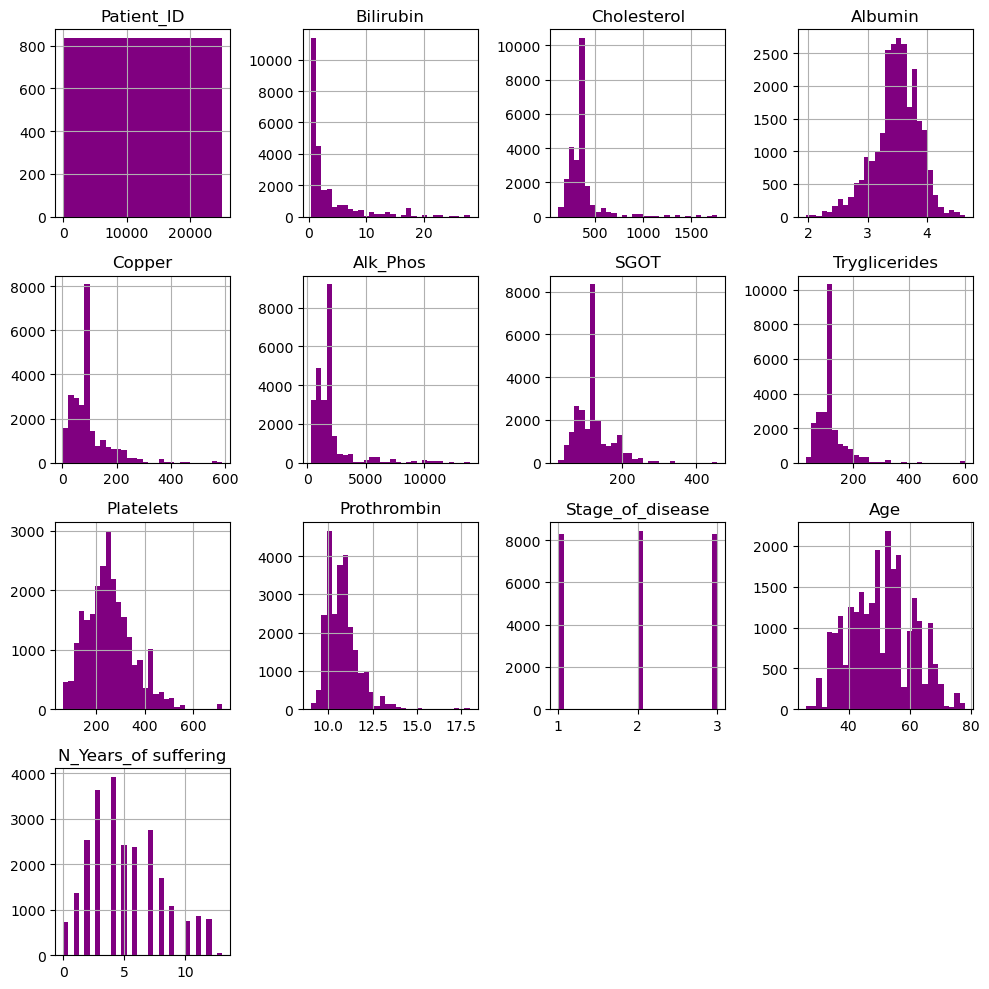

In [72]:
df.hist(figsize=(10, 10), bins=30,color="purple")
plt.tight_layout()
plt.show()


In [73]:
#know datatype of data
numeric_columns = df.select_dtypes(include=['number']).columns.tolist()
categorical_columns = df.select_dtypes(include=['object', 'category']).columns.tolist()
print("Numeric Columns:", numeric_columns)
print("Categorical Columns:", categorical_columns)


Numeric Columns: ['Patient_ID', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin', 'Stage_of_disease', 'Age', 'N_Years_of suffering']
Categorical Columns: ['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema']


In [74]:
#put target column data in last column
new = df['Stage_of_disease']
df.drop(columns=['Stage_of_disease'], axis=1, inplace=True)
df['Stage_of_disease'] = new
df

,Patient_ID,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Age,N_Years_of suffering,Stage_of_disease
0,1,Placebo,F,N,Y,N,N,0.5,149.000000,4.04,227.0,598.0,52.70,57.000000,256.0,9.9,51.0,6.0,1
1,2,Placebo,M,Y,N,Y,N,0.5,219.000000,3.93,22.0,663.0,45.00,75.000000,220.0,10.8,54.0,3.0,2
2,3,Placebo,F,N,N,N,N,0.5,320.000000,3.54,51.0,1243.0,122.45,80.000000,225.0,10.0,32.0,11.0,2
3,4,Placebo,F,N,N,N,N,0.7,255.000000,3.74,23.0,1024.0,77.50,58.000000,151.0,10.2,45.0,6.0,2
4,5,Placebo,F,N,Y,N,N,1.9,486.000000,3.54,74.0,1052.0,108.50,109.000000,151.0,11.5,59.0,6.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,24996,D-penicillamine,F,N,N,N,N,0.8,231.000000,3.87,173.0,9009.8,127.71,96.000000,295.0,11.0,65.0,10.0,2
24996,24997,D-penicillamine,F,N,N,N,N,0.8,231.000000,3.87,173.0,9009.8,127.71,96.000000,295.0,11.0,65.0,10.0,2
24997,24998,D-penicillamine,F,N,Y,Y,Y,5.1,369.510563,3.23,18.0,790.0,179.80,124.702128,104.0,13.0,46.0,3.0,3
24998,24999,D-penicillamine,F,N,Y,N,N,0.8,315.000000,4.24,13.0,1637.0,170.50,70.000000,426.0,10.9,47.0,10.0,2


In [ ]:
# def recategorize_smoking(smoking_history_val):
#     if smoking_history_val in ['never', 'No Info']:
#         return 'non_smoker'
#     elif smoking_history_val in ['current']:
#         return 'current'
#     elif smoking_history_val in ['former', 'ever', 'not current']:
#         return 'past_smoker'
    
# df['smoking_history'] = df['smoking_history'].apply(recategorize_smoking)

In [76]:
#Identify outliers for numeric columns
outliers_summary = {}
for col in numeric_columns:
    Q1 = df[col].quantile(0.25)  
    Q3 = df[col].quantile(0.75)  
    IQR = Q3 - Q1                  
   
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers_count = outliers.shape[0]
    outliers_summary[col] = outliers_count

for col, count in outliers_summary.items():
    print(f"Column: {col}, Outliers: {count}")



Column: Patient_ID, Outliers: 0
Column: Bilirubin, Outliers: 3274
Column: Cholesterol, Outliers: 2252
Column: Albumin, Outliers: 745
Column: Copper, Outliers: 2335
Column: Alk_Phos, Outliers: 2177
Column: SGOT, Outliers: 1743
Column: Tryglicerides, Outliers: 2399
Column: Platelets, Outliers: 368
Column: Prothrombin, Outliers: 772
Column: Stage_of_disease, Outliers: 0
Column: Age, Outliers: 0
Column: N_Years_of suffering, Outliers: 0


In [77]:
def calculate_outlier_percentage(df):
    outlier_data = []

    for column in df.select_dtypes(include=[np.number]): 
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outlier_percentage = (len(outliers) / len(df)) * 100

        outlier_data.append([column, round(outlier_percentage, 2)])

    return pd.DataFrame(outlier_data, columns=['Feature', 'Outlier Percentage'])

outlier_df = calculate_outlier_percentage(df)
print(outlier_df)

                 Feature  Outlier Percentage
0             Patient_ID                0.00
1              Bilirubin               13.10
2            Cholesterol                9.01
3                Albumin                2.98
4                 Copper                9.34
5               Alk_Phos                8.71
6                   SGOT                6.97
7          Tryglicerides                9.60
8              Platelets                1.47
9            Prothrombin                3.09
10                   Age                0.00
11  N_Years_of suffering                0.00
12      Stage_of_disease                0.00


In [ ]:
# Remove outliers from the dataset
# for col in outliers_summary.keys():
#     Q1 = df[col].quantile(0.25)
#     Q3 = df[col].quantile(0.75)
#     IQR = Q3 - Q1

#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

# # Display the updated dataset shape after removing outliers
# print("Dataset shape after removing outliers:", df.shape)


In [ ]:
# def remove_outliers(df, numeric_columns):
#     for col in numeric_columns:
#         Q1 = df[col].quantile(0.25)  
#         Q3 = df[col].quantile(0.75)  
#         IQR = Q3 - Q1                  

#         lower_bound = Q1 - 1.5 * IQR
#         upper_bound = Q3 + 1.5 * IQR
        
#         df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    
#     return df

# # Example usage:
# numeric_columns = df.select_dtypes(include=['number']).columns
# df_cleaned = remove_outliers(df, numeric_columns)

In [ ]:
# df[categorical_columns].value_counts(normalize=True)


In [ ]:
# df[categorical_columns].apply(lambda col: col.astype(str).str.len().describe())



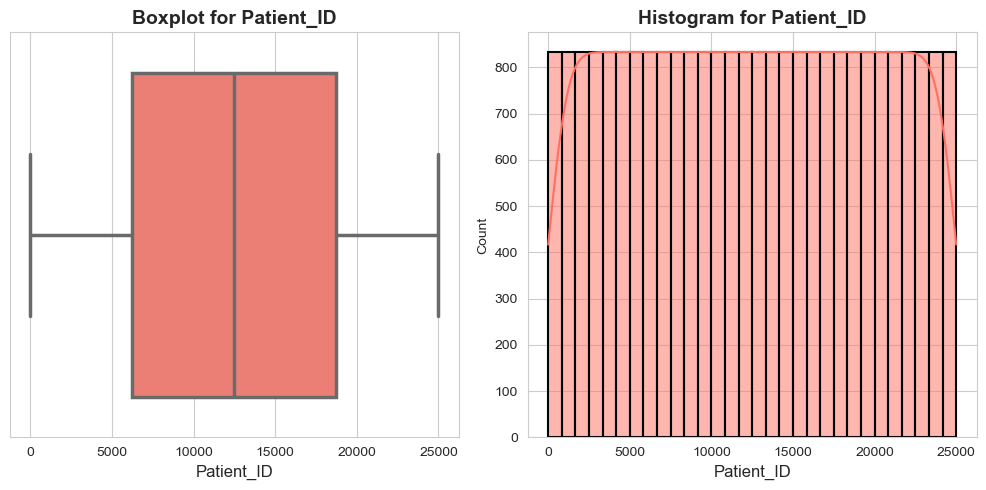

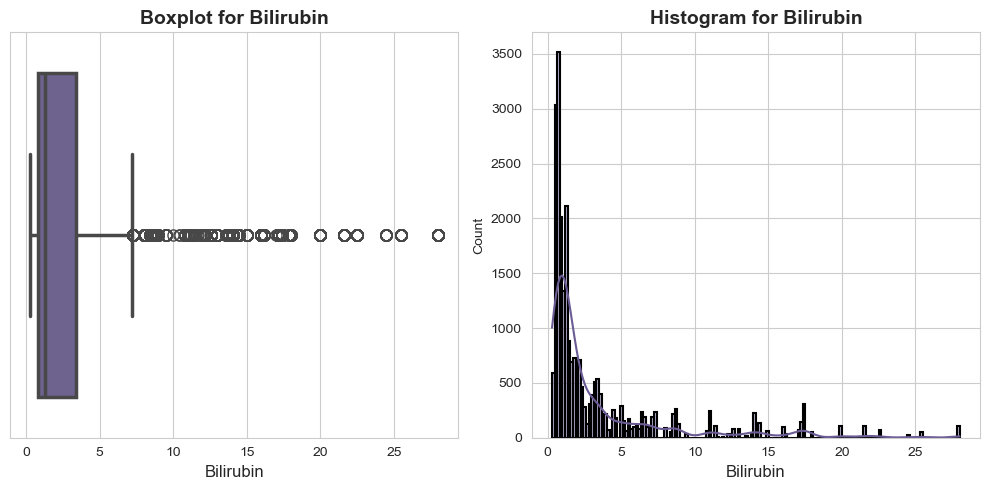

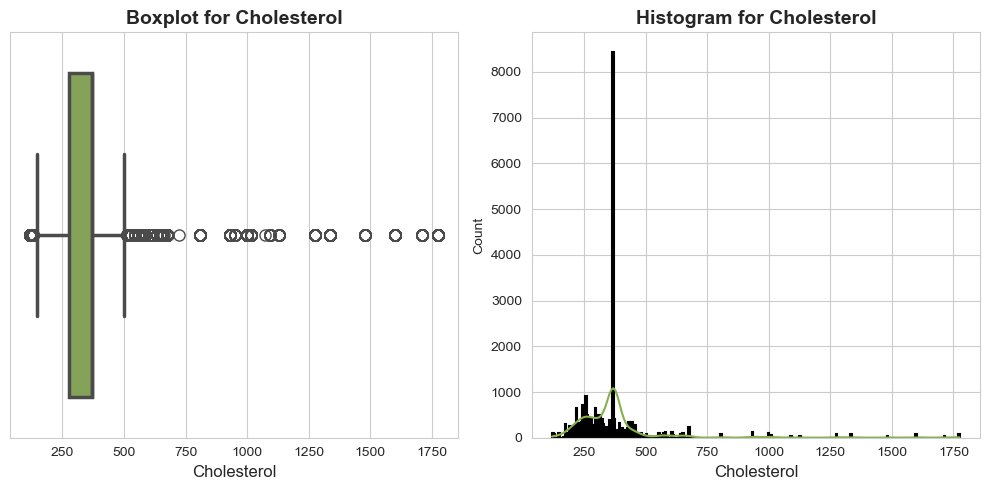

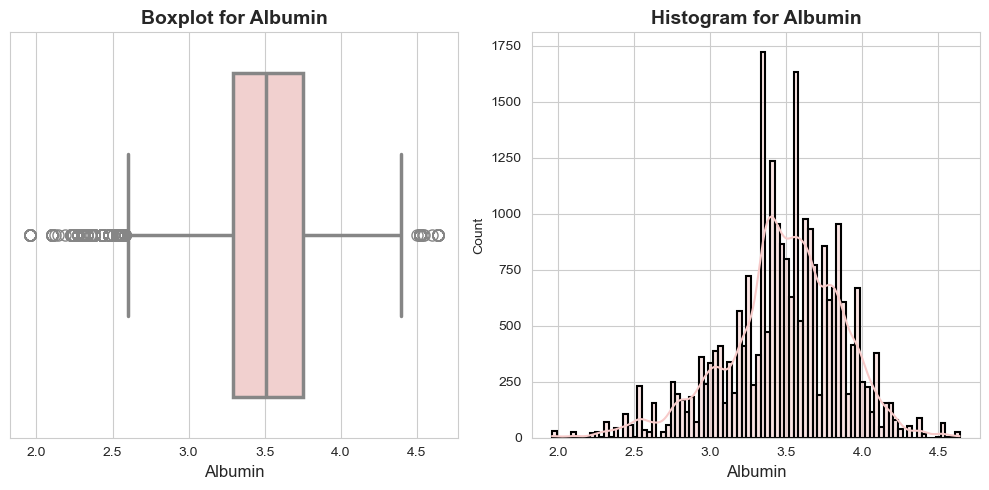

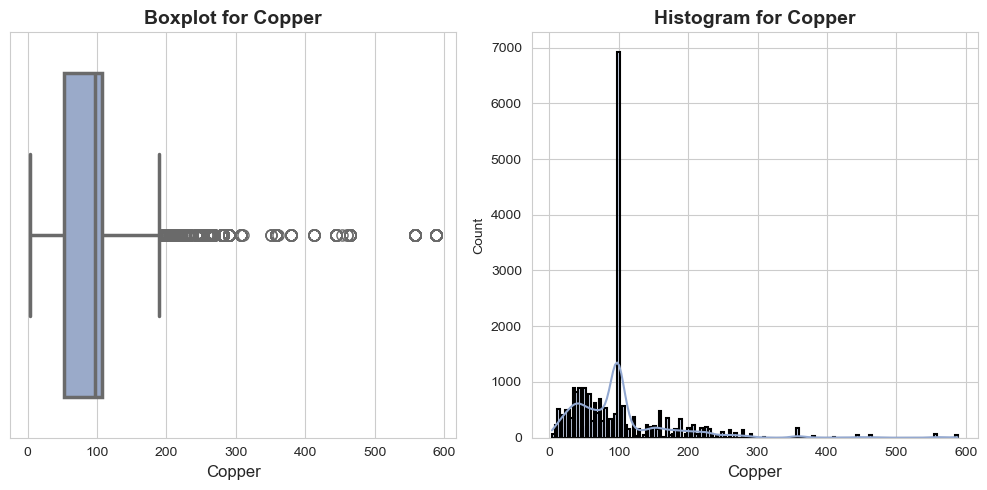

...

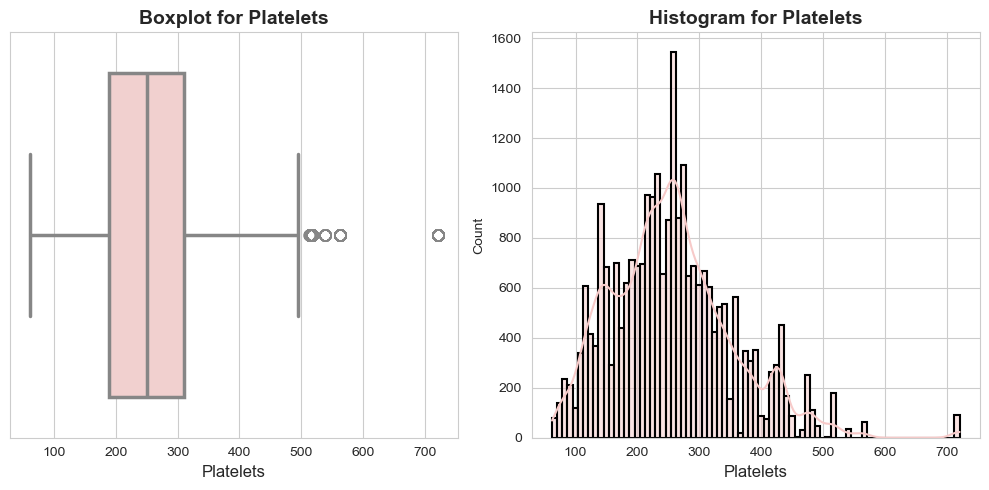

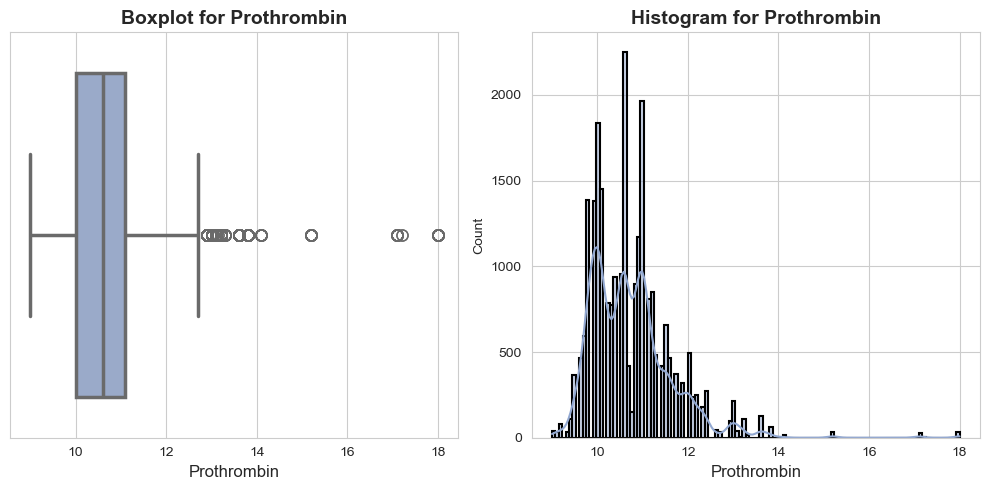

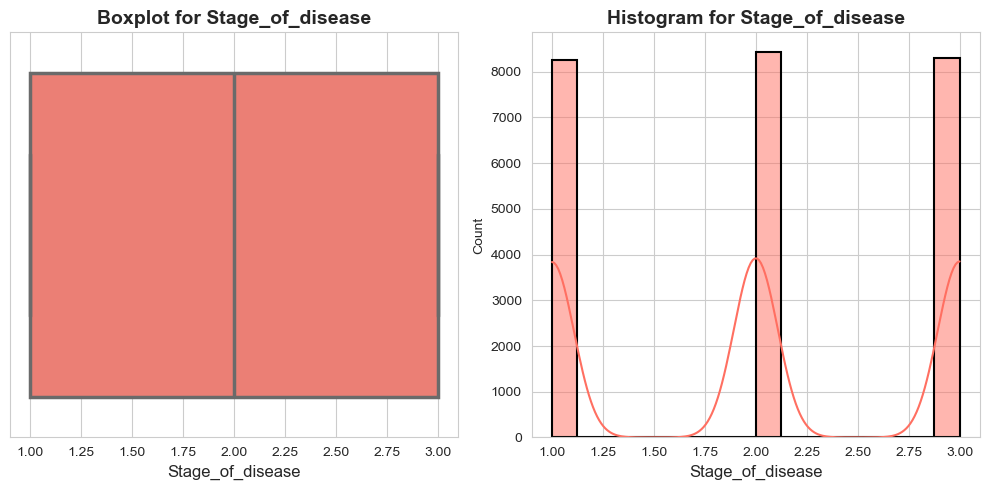

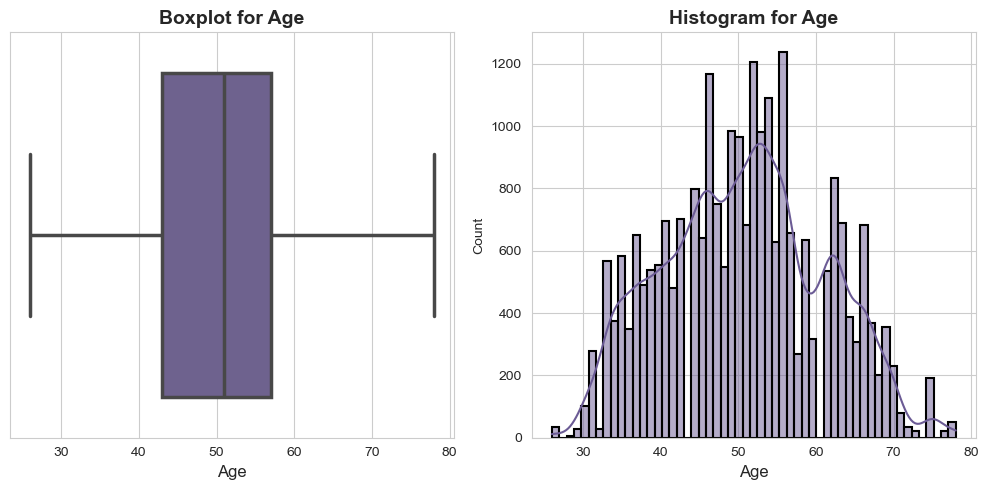

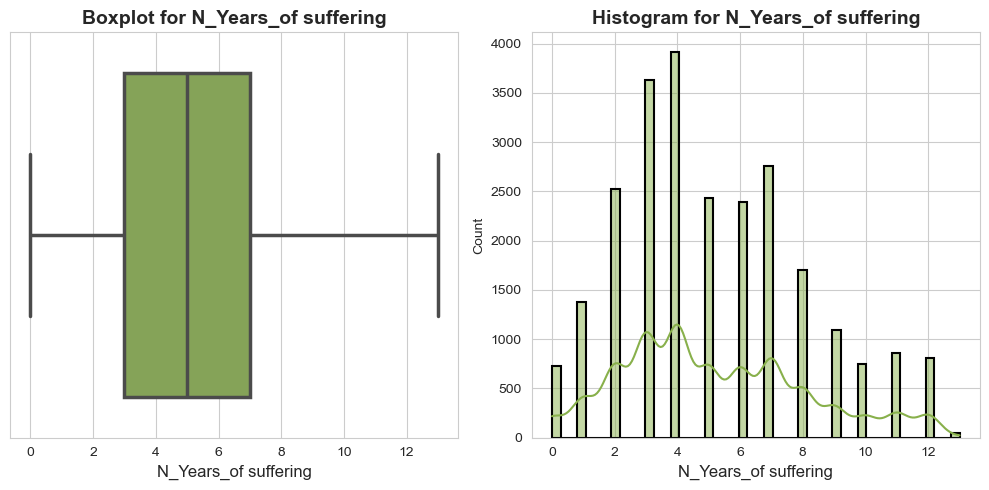

In [78]:
# Customize colors and styles
sns.set_style("whitegrid")
custom_palette = ["#ff6f61", "#6b5b95", "#88b04b", "#f7cac9", "#92a8d1"]

# Visualize the outliers
for i, col in enumerate(numeric_columns):
    plt.figure(figsize=(10, 5))
    
    # Boxplot with custom colors
    plt.subplot(1, 2, 1)
    sns.boxplot(x=df[col], color=custom_palette[i % len(custom_palette)], linewidth=2.5, fliersize=8)
    plt.title(f'Boxplot for {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    
    # Histogram with KDE and custom color
    plt.subplot(1, 2, 2)
    sns.histplot(df[col], kde=True, color=custom_palette[i % len(custom_palette)], edgecolor="black", linewidth=1.5)
    plt.title(f'Histogram for {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12)
    
    plt.tight_layout()
    plt.show()


In [79]:
categorical_columns = [col for col in categorical_columns if col in df.columns]


In [ ]:
# from sklearn.preprocessing import LabelEncoder

# for col in categorical_columns:
#     enc = LabelEncoder()
#     df.loc[:, col] = enc.fit_transform(df[col])


In [ ]:
# import numpy as np
# df['feature'] = df['feature'] + np.random.normal(0, 0.01, df.shape[0])


In [80]:
enc=LabelEncoder()
for col in categorical_columns:
    df[col] = enc.fit_transform(df[col])

df    

,Patient_ID,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Age,N_Years_of suffering,Stage_of_disease
0,1,1,0,0,1,0,0,0.5,149.000000,4.04,227.0,598.0,52.70,57.000000,256.0,9.9,51.0,6.0,1
1,2,1,1,1,0,1,0,0.5,219.000000,3.93,22.0,663.0,45.00,75.000000,220.0,10.8,54.0,3.0,2
2,3,1,0,0,0,0,0,0.5,320.000000,3.54,51.0,1243.0,122.45,80.000000,225.0,10.0,32.0,11.0,2
3,4,1,0,0,0,0,0,0.7,255.000000,3.74,23.0,1024.0,77.50,58.000000,151.0,10.2,45.0,6.0,2
4,5,1,0,0,1,0,0,1.9,486.000000,3.54,74.0,1052.0,108.50,109.000000,151.0,11.5,59.0,6.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,24996,0,0,0,0,0,0,0.8,231.000000,3.87,173.0,9009.8,127.71,96.000000,295.0,11.0,65.0,10.0,2
24996,24997,0,0,0,0,0,0,0.8,231.000000,3.87,173.0,9009.8,127.71,96.000000,295.0,11.0,65.0,10.0,2
24997,24998,0,0,0,1,1,2,5.1,369.510563,3.23,18.0,790.0,179.80,124.702128,104.0,13.0,46.0,3.0,3
24998,24999,0,0,0,1,0,0,0.8,315.000000,4.24,13.0,1637.0,170.50,70.000000,426.0,10.9,47.0,10.0,2


In [81]:
#make sure that every column is encoded correctly
print(df.dtypes)  


Patient_ID                int64
Drug                      int32
Sex                       int32
Ascites                   int32
Hepatomegaly              int32
Spiders                   int32
Edema                     int32
Bilirubin               float64
Cholesterol             float64
Albumin                 float64
Copper                  float64
Alk_Phos                float64
SGOT                    float64
Tryglicerides           float64
Platelets               float64
Prothrombin             float64
Age                     float64
N_Years_of suffering    float64
Stage_of_disease          int64
dtype: object


In [ ]:
# def apply_scaling_if_needed(df, target_column):
#     numeric_columns = df.select_dtypes(include=['number']).columns.tolist()
    
#     # no need to apply scaling on target column
#     if target_column in numeric_columns:
#         numeric_columns.remove(target_column)

#     scaler = StandardScaler()

#     for column in numeric_columns:
#         unique_values = set(df[column].unique())

#         if unique_values == {0, 1}:  
#             print(f"No need for scaling on {column}")
#         else:
#             df[column] = scaler.fit_transform(df[[column]])
#             print(f"Scaling applied on {column}")

# apply_scaling_if_needed(df, target_column='diabetes')

# print(df)


In [82]:
def apply_scaling_if_needed(df, target_column):
    numeric_columns = df.select_dtypes(include=['number']).columns.tolist()


    if target_column in numeric_columns:
        numeric_columns.remove(target_column)

    scaler = StandardScaler()

    for column in numeric_columns:
        unique_values = set(df[column].unique())

        if unique_values == {0, 1}:  
            print(f"No need for scaling on {column}")
        else:
            df[column] = scaler.fit_transform(df[[column]])
            print(f"Scaling applied on {column}")

apply_scaling_if_needed(df, target_column='Stage_of_disease')

print(df)


Scaling applied on Patient_ID
No need for scaling on Drug
No need for scaling on Sex
No need for scaling on Ascites
No need for scaling on Hepatomegaly
No need for scaling on Spiders
Scaling applied on Edema
Scaling applied on Bilirubin
Scaling applied on Cholesterol
Scaling applied on Albumin
Scaling applied on Copper
Scaling applied on Alk_Phos
Scaling applied on SGOT
Scaling applied on Tryglicerides
Scaling applied on Platelets
Scaling applied on Prothrombin
Scaling applied on Age
Scaling applied on N_Years_of suffering
       Patient_ID  Drug  Sex  Ascites  Hepatomegaly  Spiders     Edema  \
0       -1.731982     1    0        0             1        0 -0.454587   
1       -1.731843     1    1        1             0        1 -0.454587   
2       -1.731704     1    0        0             0        0 -0.454587   
3       -1.731566     1    0        0             0        0 -0.454587   
4       -1.731427     1    0        0             1        0 -0.454587   
...           ...   ...  ..

In [83]:
df

,Patient_ID,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Age,N_Years_of suffering,Stage_of_disease
0,-1.731982,1,0,0,1,0,-0.454587,-0.616613,-1.153187,1.454532,1.732843,-0.776983,-1.475838,-1.265931,-0.000074,-0.922747,0.032372,0.278930,1
1,-1.731843,1,1,1,0,1,-0.454587,-0.616613,-0.791737,1.165424,-1.068339,-0.740849,-1.637106,-0.924927,-0.364901,0.072368,0.326409,-0.734869,2
2,-1.731704,1,0,0,0,0,-0.454587,-0.616613,-0.270217,0.140406,-0.672074,-0.418421,-0.015003,-0.830204,-0.314231,-0.812179,-1.829866,1.968594,2
3,-1.731566,1,0,0,0,0,-0.454587,-0.574127,-0.605849,0.666056,-1.054675,-0.540165,-0.956430,-1.246986,-1.064152,-0.591042,-0.555703,0.278930,2
4,-1.731427,1,0,0,1,0,-0.454587,-0.319209,0.586935,0.140406,-0.357795,-0.524599,-0.307170,-0.280808,-1.064152,0.846347,0.816472,0.278930,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,1.731427,0,0,0,0,0,-0.454587,-0.552884,-0.729775,1.007729,0.994971,3.899228,0.095162,-0.527089,0.395154,0.293505,1.404547,1.630661,2
24996,1.731566,0,0,0,0,0,-0.454587,-0.552884,-0.729775,1.007729,0.994971,3.899228,0.095162,-0.527089,0.395154,0.293505,1.404547,1.630661,2
24997,1.731704,0,0,0,1,1,3.422816,0.360572,-0.014566,-0.674353,-1.122996,-0.670248,1.186128,0.016663,-1.540453,2.504872,-0.457691,-0.734869,3
24998,1.731843,0,0,0,1,0,-0.454587,-0.552884,-0.296035,1.980183,-1.191318,-0.199392,0.991350,-1.019650,1.722718,0.182937,-0.359678,1.630661,2


In [ ]:
# # تحديد الأعمدة
# columns_to_convert = ["Smoking", "Medication", "Obesity", "Heart_Attack", "Diabetes", "Family_History", "Angina", "Heart_Disease_History"]

# # تحويل قيم True/False إلى 1/0 فقط في الأعمدة المحددة
# df[columns_to_convert] = df[columns_to_convert].astype(int)

# print(df)

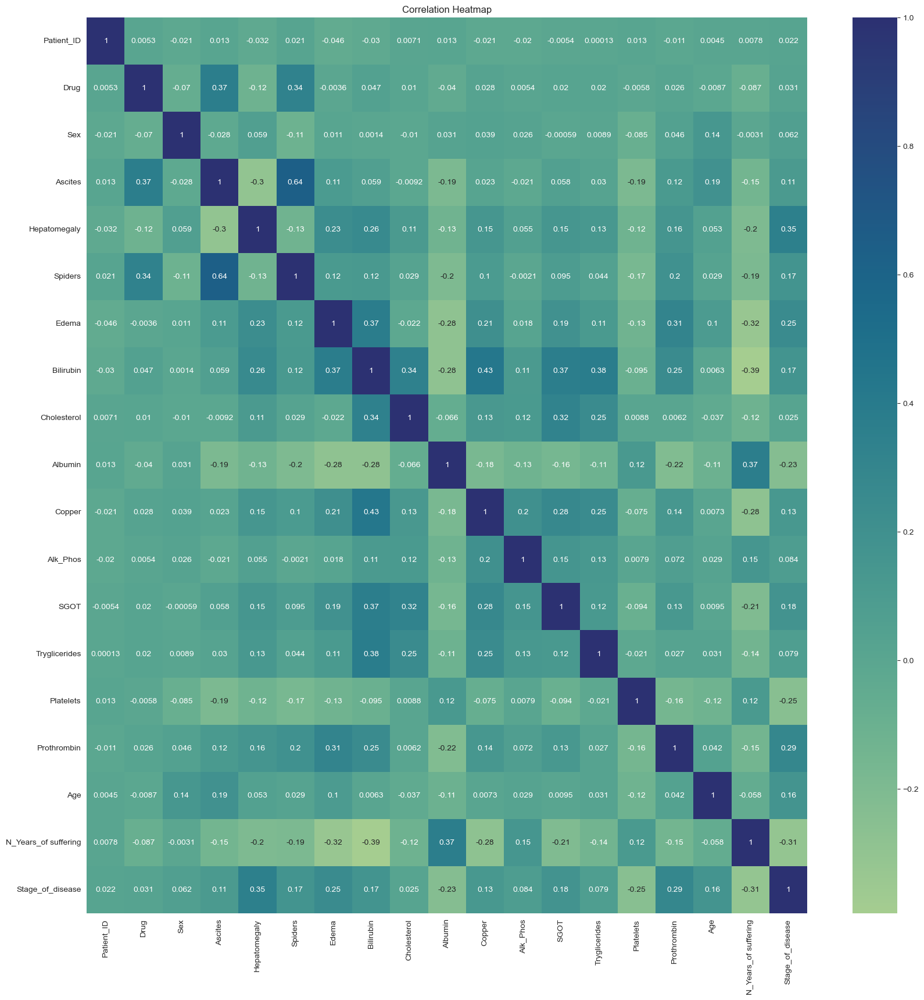

In [84]:
#heat map
numeric_columns = df.select_dtypes(include=['number']).columns.tolist()
corr_matrix = df[numeric_columns].corr()
plt.figure(figsize=(20,20))
sns.heatmap(corr_matrix, annot=True, cmap='crest')
plt.title('Correlation Heatmap')
plt.show()


In [85]:
correlation_matrix = df.corr()
target_correlation = correlation_matrix['Stage_of_disease']
print(target_correlation)


Patient_ID              0.021864
Drug                    0.030862
Sex                     0.061687
Ascites                 0.111012
Hepatomegaly            0.353210
Spiders                 0.168049
Edema                   0.251095
Bilirubin               0.168006
Cholesterol             0.025415
Albumin                -0.231631
Copper                  0.131763
Alk_Phos                0.084407
SGOT                    0.175301
Tryglicerides           0.079228
Platelets              -0.250058
Prothrombin             0.288107
Age                     0.164505
N_Years_of suffering   -0.308298
Stage_of_disease        1.000000
Name: Stage_of_disease, dtype: float64


In [86]:
df.columns

Index(['Patient_ID', 'Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders',
       'Edema', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos',
       'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin', 'Age',
       'N_Years_of suffering', 'Stage_of_disease'],
      dtype='object')

In [87]:
df.drop(['Patient_ID'],axis=1,inplace=True)
df

,Drug,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Age,N_Years_of suffering,Stage_of_disease
0,1,0,0,1,0,-0.454587,-0.616613,-1.153187,1.454532,1.732843,-0.776983,-1.475838,-1.265931,-0.000074,-0.922747,0.032372,0.278930,1
1,1,1,1,0,1,-0.454587,-0.616613,-0.791737,1.165424,-1.068339,-0.740849,-1.637106,-0.924927,-0.364901,0.072368,0.326409,-0.734869,2
2,1,0,0,0,0,-0.454587,-0.616613,-0.270217,0.140406,-0.672074,-0.418421,-0.015003,-0.830204,-0.314231,-0.812179,-1.829866,1.968594,2
3,1,0,0,0,0,-0.454587,-0.574127,-0.605849,0.666056,-1.054675,-0.540165,-0.956430,-1.246986,-1.064152,-0.591042,-0.555703,0.278930,2
4,1,0,0,1,0,-0.454587,-0.319209,0.586935,0.140406,-0.357795,-0.524599,-0.307170,-0.280808,-1.064152,0.846347,0.816472,0.278930,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,0,0,0,0,0,-0.454587,-0.552884,-0.729775,1.007729,0.994971,3.899228,0.095162,-0.527089,0.395154,0.293505,1.404547,1.630661,2
24996,0,0,0,0,0,-0.454587,-0.552884,-0.729775,1.007729,0.994971,3.899228,0.095162,-0.527089,0.395154,0.293505,1.404547,1.630661,2
24997,0,0,0,1,1,3.422816,0.360572,-0.014566,-0.674353,-1.122996,-0.670248,1.186128,0.016663,-1.540453,2.504872,-0.457691,-0.734869,3
24998,0,0,0,1,0,-0.454587,-0.552884,-0.296035,1.980183,-1.191318,-0.199392,0.991350,-1.019650,1.722718,0.182937,-0.359678,1.630661,2


In [88]:
df.columns

Index(['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema',
       'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT',
       'Tryglicerides', 'Platelets', 'Prothrombin', 'Age',
       'N_Years_of suffering', 'Stage_of_disease'],
      dtype='object')

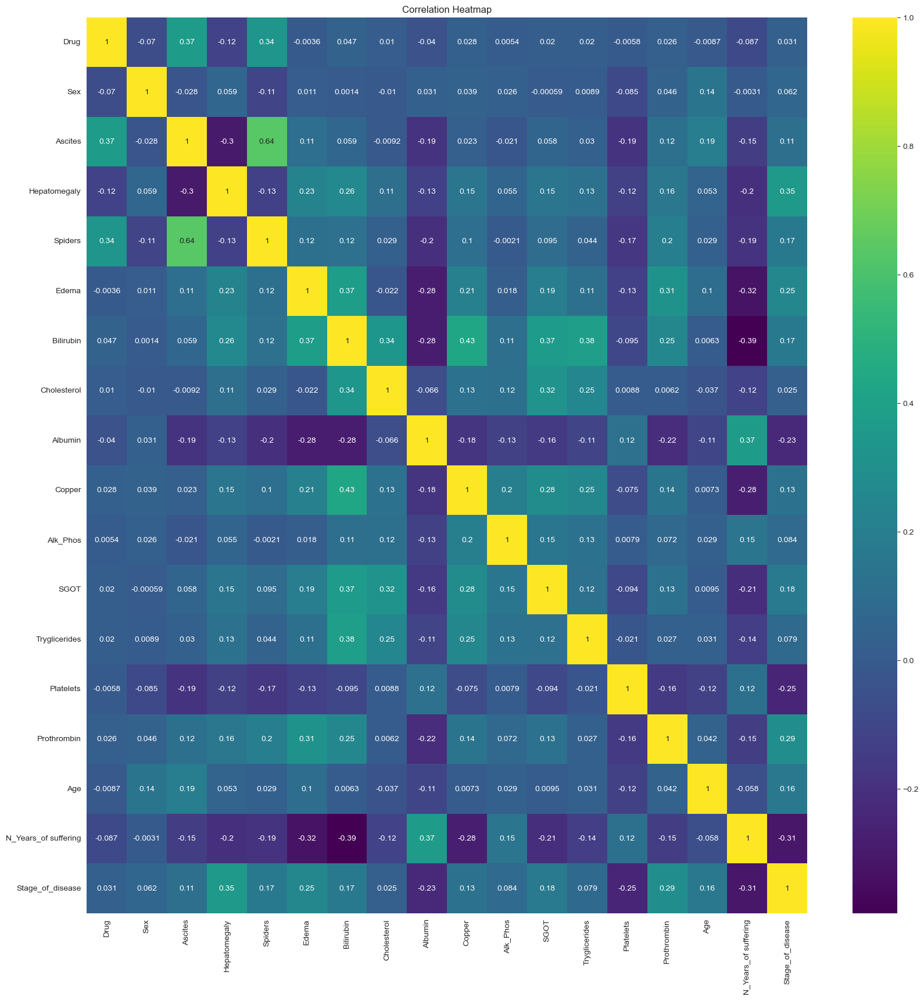

In [89]:
#heat map
numeric_columns = df.select_dtypes(include=['number']).columns.tolist()
corr_matrix = df[numeric_columns].corr()
plt.figure(figsize=(20,20))
sns.heatmap(corr_matrix, annot=True, cmap='viridis')
plt.title('Correlation Heatmap')
plt.show()

In [90]:
def calculate_outlier_percentage(df):
    outlier_data = []

    for column in df.select_dtypes(include=[np.number]): 
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outlier_percentage = (len(outliers) / len(df)) * 100

        outlier_data.append([column, round(outlier_percentage, 2)])

    return pd.DataFrame(outlier_data, columns=['Feature', 'Outlier Percentage'])

outlier_df = calculate_outlier_percentage(df)
print(outlier_df)

                 Feature  Outlier Percentage
0                   Drug                0.00
1                    Sex               11.45
2                Ascites                0.00
3           Hepatomegaly                0.00
4                Spiders                0.00
5                  Edema               19.12
6              Bilirubin               12.14
7            Cholesterol                9.01
8                Albumin                2.98
9                 Copper                9.34
10              Alk_Phos                8.71
11                  SGOT                6.97
12         Tryglicerides                9.60
13             Platelets                1.48
14           Prothrombin                3.09
15                   Age                0.00
16  N_Years_of suffering                0.20
17      Stage_of_disease                0.00


In [91]:
df["Stage_of_disease"].value_counts(normalize=True) * 100


Stage_of_disease
2    33.764
3    33.176
1    33.060
Name: proportion, dtype: float64

In [92]:
df['Stage_of_disease'] = LabelEncoder().fit_transform(df['Stage_of_disease'])  

In [97]:
df["Stage_of_disease"].value_counts()

Stage_of_disease
1    8441
2    8294
0    8265
Name: count, dtype: int64

In [98]:
X = df.drop(columns=['Stage_of_disease'])  
y = df['Stage_of_disease'] 

In [99]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=1)

c:\Users\arwah\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



Complete LogisticRegression Training! 0.5933714285714285
Complete LogisticRegression Test! 0.5914666666666667
Accuracy: 0.5915
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.61      0.59      2432
           1       0.54      0.48      0.51      2596
           2       0.66      0.69      0.68      2472

    accuracy                           0.59      7500
   macro avg       0.59      0.59      0.59      7500
weighted avg       0.59      0.59      0.59      7500



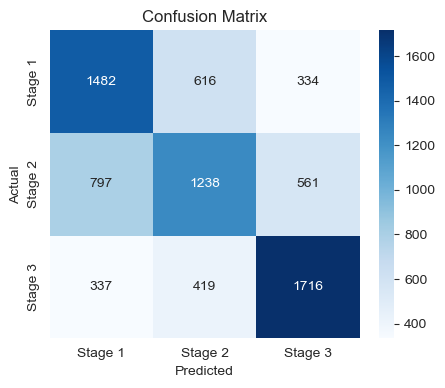

In [100]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)
Tr_score = model.score(X_train, y_train)
Tst_score = model.score(X_test, y_test)


print("Complete LogisticRegression Training!", Tr_score)
print("Complete LogisticRegression Test!", Tst_score)
print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:\n", class_report)

plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Stage 1", "Stage 2", "Stage 3"], yticklabels=["Stage 1", "Stage 2", "Stage 3"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# #first model "LogisticRegression" without any improvement    veryyyyy gooooood
# model = LogisticRegression()
# model.fit(X_train, y_train)
# y_pred = model.predict(X_test)

# accuracy = accuracy_score(y_test, y_pred)
# conf_matrix = confusion_matrix(y_test, y_pred)
# class_report = classification_report(y_test, y_pred)
# Tr_score=model.score(X_train,y_train)
# Tst_score=model.score(X_test,y_test)

# print("Complete LogisticRegression Training !",Tr_score)
# print("Complete LogisticRegression Test!",Tst_score)

# print(f"Accuracy: {accuracy:.4f}")
# print("Classification Report:\n", class_report)


# plt.figure(figsize=(5, 4))
# sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["No Diabetes", "Diabetes"], yticklabels=["No Diabetes", "Diabetes"])
# plt.xlabel("Predicted")
# plt.ylabel("Actual")
# plt.title("Confusion Matrix")
# plt.show()



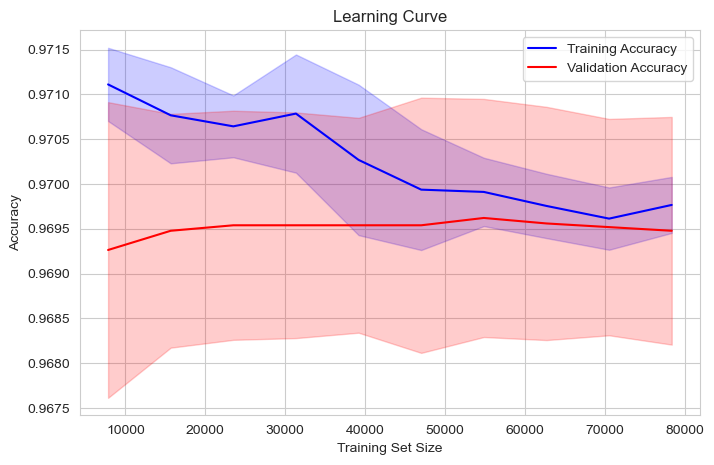

In [129]:
train_sizes, train_scores, test_scores = learning_curve(LogisticRegression(), 
                                                        X, y, cv=5, 
                                                        train_sizes=np.linspace(0.1, 1.0, 10), 
                                                        scoring="accuracy")


train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)


plt.figure(figsize=(8, 5))
plt.plot(train_sizes, train_mean, label="Training Accuracy", color="blue")
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color="blue")

plt.plot(train_sizes, test_mean, label="Validation Accuracy", color="red")
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color="red")

plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve")
plt.legend()
plt.show()


In [ ]:
# from sklearn.metrics import f1_score, precision_recall_curve

# # حساب الاحتمالات
# y_probs = model.predict_proba(X_test)[:, 1]

# # حساب Precision-Recall لكل عتبة
# precisions, recalls, thresholds = precision_recall_curve(y_test, y_probs)

# # إيجاد أفضل عتبة بناءً على أعلى f1-score
# f1_scores = 2 * (precisions * recalls) / (precisions + recalls)
# best_threshold = thresholds[np.argmax(f1_scores)]
# print(f"Best Threshold: {best_threshold:.2f}")

# # تطبيق العتبة الجديدة
# y_pred_best = (y_probs >= best_threshold).astype(int)

# # إعادة التقييم
# accuracy = accuracy_score(y_test, y_pred_best)
# conf_matrix = confusion_matrix(y_test, y_pred_best)
# class_report = classification_report(y_test, y_pred_best)

# print(f"Optimized Accuracy: {accuracy:.4f}")
# print("Optimized Classification Report:\n", class_report)

# # رسم منحنى Precision-Recall
# plt.figure(figsize=(8, 6))
# plt.plot(thresholds, precisions[:-1], label="Precision")
# plt.plot(thresholds, recalls[:-1], label="Recall")
# plt.axvline(x=best_threshold, color='r', linestyle='--', label=f"Best Threshold: {best_threshold:.2f}")
# plt.xlabel("Threshold")
# plt.ylabel("Score")
# plt.legend()
# plt.title("Precision-Recall vs Threshold")
# plt.show()


In [ ]:
# #first model "LogisticRegression" with Smote and Class Weigh


# # # smote to increase number of smaller data
# # sm = SMOTE(random_state=1)
# # Xtrain_res, y_train_res = sm.fit_resample(X_train, y_train)


# model= LogisticRegression(class_weight='balanced', random_state=1)
# model.fit(X_train, y_train)

# # Logistic Regression
# model = LogisticRegression()
# model.fit(Xtrain_res, y_train_res)

# # logisticRegression
# logR_predict = model.predict(X_test)

# # accuracy
# Tr_score = model.score(X_train, y_train)
# Tst_score = model.score(X_test, y_test)

# print("Complete LogisticRegression Training Accuracy:", Tr_score)
# print("Complete LogisticRegression Test Accuracy:", Tst_score)
# print("Confusion Matrix:\n", confusion_matrix(y_test, logR_predict))
# print("\nClassification Report:\n", classification_report(y_test, logR_predict))

# plt.figure(figsize=(5, 4))
# sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["No Diabetes", "Diabetes"], yticklabels=["No Diabetes", "Diabetes"])
# plt.xlabel("Predicted")
# plt.ylabel("Actual")
# plt.title("Confusion Matrix")
# plt.show()

Complete LogisticRegression Training Accuracy: 0.5924151696606786
Complete LogisticRegression Test Accuracy: 0.5902666666666667
Accuracy: 0.5903
Confusion Matrix:
 [[1483  612  337]
 [ 806 1226  564]
 [ 337  417 1718]]

Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.61      0.59      2432
           1       0.54      0.47      0.51      2596
           2       0.66      0.69      0.67      2472

    accuracy                           0.59      7500
   macro avg       0.59      0.59      0.59      7500
weighted avg       0.59      0.59      0.59      7500



c:\Users\arwah\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



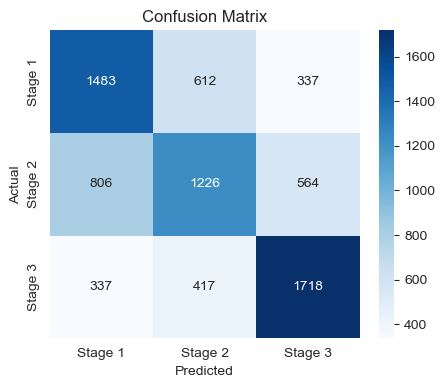

In [101]:
sm = SMOTE(random_state=1)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)


model = LogisticRegression(multi_class='multinomial', solver='lbfgs', class_weight='balanced', random_state=1)
model.fit(X_train_res, y_train_res)


logR_predict = model.predict(X_test)


Tr_score = model.score(X_train_res, y_train_res)
Tst_score = model.score(X_test, y_test)
accuracy = accuracy_score(y_test, logR_predict)
conf_matrix = confusion_matrix(y_test, logR_predict)
class_report = classification_report(y_test, logR_predict)


print("Complete LogisticRegression Training Accuracy:", Tr_score)
print("Complete LogisticRegression Test Accuracy:", Tst_score)
print(f"Accuracy: {accuracy:.4f}")
print("Confusion Matrix:\n", conf_matrix)
print("\nClassification Report:\n", class_report)


plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Stage 1", "Stage 2", "Stage 3"], yticklabels=["Stage 1", "Stage 2", "Stage 3"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
importances = np.abs(model.coef_)[0]  
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 6))
plt.title("Feature Importance (Logistic Regression)")
plt.bar(range(len(importances)), importances[indices], align="center", color="skyblue")
plt.xticks(range(len(importances)), X_train.columns[indices], rotation=90)
plt.ylabel("Coefficient Magnitude")
plt.xlabel("Features")
plt.show()


In [ ]:
# # Feature Importance
# importances = np.abs(model.coef_)[0]  
# low_importance_features = X_train.columns[importances < 0.01]
# print("Features to drop:", list(low_importance_features))




In [ ]:
# df.drop(['Sleep Quality', 'Income', 'Marital Status'],axis=1,inplace=True)


In [ ]:
# df.columns

c:\Users\arwah\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[23:18:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.




XGB Training Accuracy: 0.9890857142857142
XGB Test Accuracy: 0.9596
XGBoost Accuracy: 0.9596
Confusion Matrix:
 [[2308   94   30]
 [  65 2488   43]
 [  30   41 2401]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.95      0.95      2432
           1       0.95      0.96      0.95      2596
           2       0.97      0.97      0.97      2472

    accuracy                           0.96      7500
   macro avg       0.96      0.96      0.96      7500
weighted avg       0.96      0.96      0.96      7500



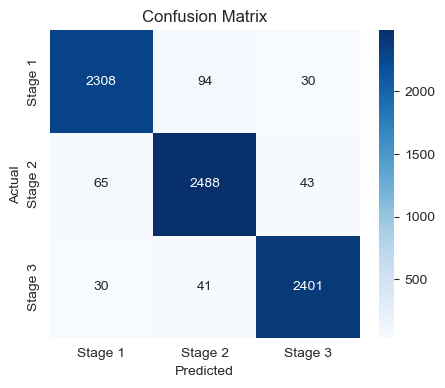

In [102]:
model2 = XGBClassifier(scale_pos_weight=15, random_state=42, objective='multi:softmax', num_class=3)  
model2.fit(X_train, y_train)


train_accuracy = accuracy_score(y_train, model2.predict(X_train))
test_accuracy = accuracy_score(y_test, model2.predict(X_test))


y_pred_xgb = model2.predict(X_test)


print("XGB Training Accuracy:", train_accuracy)
print("XGB Test Accuracy:", test_accuracy)
print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_xgb))
print("Classification Report:\n", classification_report(y_test, y_pred_xgb))

plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred_xgb), annot=True, fmt="d", cmap="Blues", xticklabels=["Stage 1", "Stage 2", "Stage 3"], yticklabels=["Stage 1", "Stage 2", "Stage 3"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

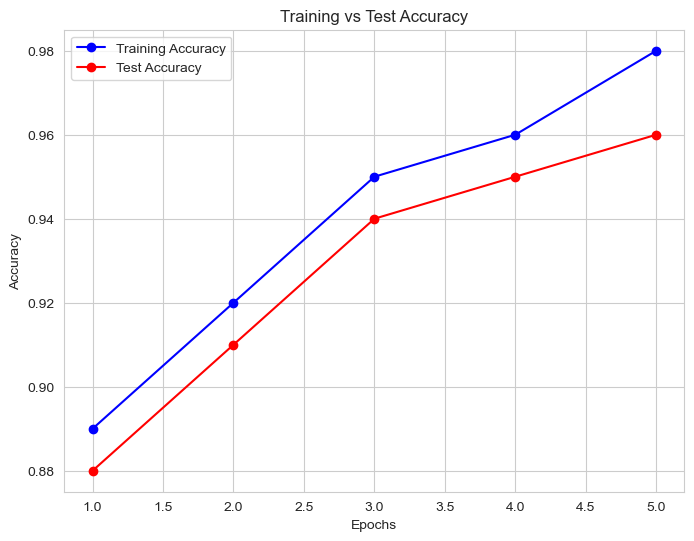

In [103]:

train_accuracy = [0.89, 0.92, 0.95, 0.96, 0.98]  
test_accuracy = [0.88, 0.91, 0.94, 0.95, 0.96]  
epochs = [1, 2, 3, 4, 5]  

plt.figure(figsize=(8, 6))
plt.plot(epochs, train_accuracy, label="Training Accuracy", color="blue", marker='o')
plt.plot(epochs, test_accuracy, label="Test Accuracy", color="red", marker='o')

plt.title('Training vs Test Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# #second model XGB without any improvements
# model2 = XGBClassifier(scale_pos_weight=15, random_state=42)  
# model2.fit(X_train, y_train)
# train_accuracy = accuracy_score(y_train, model2.predict(X_train))
# test_accuracy = accuracy_score(y_test, model2.predict(X_test))

# # accuracy
# y_pred_xgb = model2.predict(X_test)
# print("XGB Training Accuracy:", train_accuracy)
# print("XGB Test Accuracy:", test_accuracy)
# print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))
# print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_xgb))
# print("Classification Report:\n", classification_report(y_test, y_pred_xgb))


In [ ]:
# train_sizes, train_scores, test_scores = learning_curve(XGBClassifier(), 
#                                                         X, y, cv=5, 
#                                                         train_sizes=np.linspace(0.1, 1.0, 10), 
#                                                         scoring="accuracy")


# train_mean = np.mean(train_scores, axis=1)
# train_std = np.std(train_scores, axis=1)
# test_mean = np.mean(test_scores, axis=1)
# test_std = np.std(test_scores, axis=1)


# plt.figure(figsize=(8, 5))
# plt.plot(train_sizes, train_mean, label="Training Accuracy", color="blue")
# plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color="blue")

# plt.plot(train_sizes, test_mean, label="Validation Accuracy", color="red")
# plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color="red")

# plt.xlabel("Training Set Size")
# plt.ylabel("Accuracy")
# plt.title("Learning Curve")
# plt.legend()
# plt.show()

In [105]:
num_classes = len(set(y_train))  
model2 = XGBClassifier(
    n_estimators=500,
    # scale_pos_weight = neg / pos, 
    max_depth=5,  
    learning_rate=0.01,    
    random_state=42,
    reg_lambda=20, 
    reg_alpha=10,
    subsample=0.7, 
    colsample_bytree=0.7,
    eval_metric="mlogloss",  
    objective='multi:softmax',  
    num_class=num_classes  
)


model2.fit(
    X_train, 
    y_train, 
    verbose=True
)


y_pred = model2.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)


print(f"XGBoost Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)


train_accuracy = accuracy_score(y_train, model2.predict(X_train))
test_accuracy = accuracy_score(y_test, model2.predict(X_test))

print("XGBoost Training Accuracy:", train_accuracy)
print("XGBoost Test Accuracy:", test_accuracy)


XGBoost Accuracy: 0.8533333333333334
Confusion Matrix:
[[2038  321   73]
 [ 231 2195  170]
 [  90  215 2167]]
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      2432
           1       0.80      0.85      0.82      2596
           2       0.90      0.88      0.89      2472

    accuracy                           0.85      7500
   macro avg       0.86      0.85      0.85      7500
weighted avg       0.85      0.85      0.85      7500

XGBoost Training Accuracy: 0.8677142857142857
XGBoost Test Accuracy: 0.8533333333333334


In [ ]:
# #حلوووو اووووي

# neg, pos = np.bincount(y_train)
# scale_pos_weight = neg / pos  


# model2 = XGBClassifier(
#     n_estimators=200,
#     scale_pos_weight = neg / pos, 
#     # scale_pos_weight=15,  
#     max_depth=2,  
#     learning_rate=0.05,    
#     random_state=42,
#     reg_lambda=20, 
#     reg_alpha=10,
#     subsample=0.5, 
#     colsample_bytree=0.5,
#     eval_metric="logloss"
# )


# model2.fit(
#     X_train, 
#     y_train, 
#     verbose=True
# )


# y_pred = model2.predict(X_test)


# accuracy = accuracy_score(y_test, y_pred)
# conf_matrix = confusion_matrix(y_test, y_pred)
# class_report = classification_report(y_test, y_pred)

# test_accuracy = accuracy_score(y_test, model2.predict(X_test))
# train_accuracy = accuracy_score(y_train, model2.predict(X_train))

# print(f"XGBoost Accuracy: {accuracy}")
# print("Confusion Matrix:")
# print(conf_matrix)
# print("Classification Report:")
# print(class_report)
# train_accuracy = accuracy_score(y_train, model.predict(X_train))
# print("XGBoost Training Accuracy:", train_accuracy)
# print("XGBoost Test Accuracy:", test_accuracy)



In [ ]:
# model2= XGBClassifier(scale_pos_weight=15, reg_lambda=7, random_state=42)


# train_sizes, train_scores, test_scores = learning_curve(
#     model2, X, y, cv=5, train_sizes=np.linspace(0.1, 1.0, 10), scoring="accuracy"
# )


# train_mean = np.mean(train_scores, axis=1)
# train_std = np.std(train_scores, axis=1)
# test_mean = np.mean(test_scores, axis=1)
# test_std = np.std(test_scores, axis=1)


# plt.figure(figsize=(8, 5))
# plt.plot(train_sizes, train_mean, label="Training Accuracy", color="blue")
# plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color="blue")

# plt.plot(train_sizes, test_mean, label="Validation Accuracy", color="red")
# plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color="red")

# plt.xlabel("Training Set Size")
# plt.ylabel("Accuracy")
# plt.title("Learning Curve (Detecting Overfitting)")
# plt.legend()
# plt.show()


In [121]:
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
# from imblearn.over_sampling import SMOTE
# from xgboost import XGBClassifier
# import numpy as np

# # تقسيم البيانات
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# # معالجة عدم توازن البيانات باستخدام SMOTE
# smote = SMOTE(random_state=42)
# X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# # ضبط المعلمات يدويًا بدلًا من GridSearchCV
# xgb = XGBClassifier(
#     n_estimators=300,         # عدد الأشجار
#     max_depth=5,              # عمق الشجرة
#     learning_rate=0.05,       # معدل التعلم
#     scale_pos_weight=3,       # موازنة الفئات
#     use_label_encoder=False,
#     eval_metric='logloss',
#     random_state=42
# )

# # تدريب النموذج
# xgb.fit(X_train_resampled, y_train_resampled)

# # استخدام احتمالات التنبؤ بدلاً من التنبؤ المباشر
# y_probs = xgb.predict_proba(X_test)[:, 1]  # احتمالات الفئة 1
# threshold = 0.3  # تخفيض العتبة لتحسين Recall للفئة 1
# y_pred = (y_probs >= threshold).astype(int)

# # تقييم الأداء
# accuracy = accuracy_score(y_test, y_pred)
# train_accuracy = accuracy_score(y_train_resampled, best_xgb.predict(X_train_resampled))
# print("XGBoost Training Accuracy:", train_accuracy)

# conf_matrix = confusion_matrix(y_test, y_pred)
# class_report = classification_report(y_test, y_pred)

# # print("XGB Training Accuracy:", train_accuracy)
# # print("XGB Test Accuracy:", test_accuracy)
# print(f"🔹 XGBoost Accuracy: {accuracy:.4f}")
# print("🔹 Confusion Matrix:\n", conf_matrix)
# print("🔹 Classification Report:\n", class_report)


In [106]:

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

num_classes = len(set(y_train)) 


param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1],
    'gamma': [0, 0.1, 0.2, 0.3],
    'subsample': [0.8, 0.9, 1],
    'colsample_bytree': [0.7, 0.8],
    'min_child_weight': [1, 2, 3],
}


xgb = XGBClassifier(
    use_label_encoder=False, 
    eval_metric='mlogloss',  
    random_state=42,
    objective='multi:softmax',  
    num_class=num_classes       
)


random_search = RandomizedSearchCV(
    xgb, param_dist, cv=5, scoring='accuracy', n_jobs=-1, n_iter=10, random_state=42
)


random_search.fit(X_train_resampled, y_train_resampled)


best_xgb = random_search.best_estimator_

y_pred = best_xgb.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print(f"XGBoost Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)


c:\Users\arwah\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning:

[23:22:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




XGBoost Accuracy: 0.9576
Confusion Matrix:
[[2302   99   31]
 [  72 2483   41]
 [  26   49 2397]]
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95      2432
           1       0.94      0.96      0.95      2596
           2       0.97      0.97      0.97      2472

    accuracy                           0.96      7500
   macro avg       0.96      0.96      0.96      7500
weighted avg       0.96      0.96      0.96      7500



In [ ]:
# #second model XGB with grid parameters & smote & alot of improvements
# from sklearn.model_selection import RandomizedSearchCV

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


# smote = SMOTE(random_state=42)
# X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)


# param_dist = {
#     'n_estimators': [100],
#     'max_depth': [1,2],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'gamma': [0, 0.1, 0.2, 0.3],  
#     'subsample': [0.9, 0.8, 1],  
#     'colsample_bytree': [0.7, 0.8],  
#     'min_child_weight': [1, 2, 3],  
#     'scale_pos_weight': [1, len(y_train[y_train == 0]) / len(y_train[y_train == 1])]
# }

# xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
# random_search = RandomizedSearchCV(xgb, param_dist, cv=5, scoring='accuracy', n_jobs=-1, n_iter=10, random_state=42)
# random_search.fit(X_train_resampled, y_train_resampled)

# # أفضل معلمات
# best_xgb = random_search.best_estimator_

# # التقييم على مجموعة الاختبار
# y_pred = best_xgb.predict(X_test)
# accuracy = accuracy_score(y_test, y_pred)
# conf_matrix = confusion_matrix(y_test, y_pred)
# class_report = classification_report(y_test, y_pred)

# # print("XGB Training Accuracy:", train_accuracy)
# # print("XGB Test Accuracy:", test_accuracy)
# print(f"XGBoost Accuracy: {accuracy}")
# print("Confusion Matrix:")
# print(conf_matrix)
# print("Classification Report:")
# print(class_report)


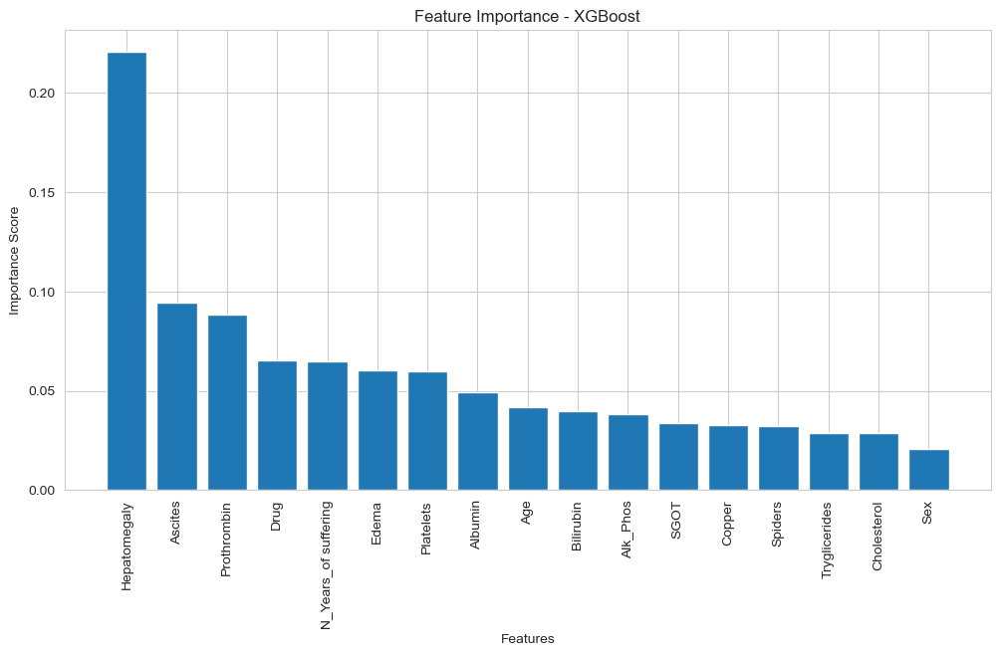

In [107]:
importances = model2.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 6))
plt.title("Feature Importance - XGBoost")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.show()


In [ ]:
# # استخراج أهمية الميزات من نموذج XGBoost
# importances = best_xgb.feature_importances_

# # إنشاء DataFrame لعرض الميزات وأهميتها
# feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# # تحديد الميزات ذات الأهمية المنخفضة جدًا
# low_importance_features = feature_importance_df[feature_importance_df["Importance"] < 0.01]["Feature"].tolist()

# print(f"Features to drop: {low_importance_features}")


In [ ]:
# df.drop(['gender', 'hypertension', 'heart_disease', 'Sleep Quality', 'Disease Awareness', 'Region', 'Marital Status'],axis=1,inplace=True)


In [108]:
#third model Balanced Random Forest Classifier without improvements

model3= BalancedRandomForestClassifier(random_state=42)
model3.fit(X_train, y_train)
y_pred_rf = model3.predict(X_test)
print("Balanced Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("Balanced Random Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))
print(f"rf Accuracy: {accuracy}")
print("rf Training Accuracy:", train_accuracy)
print("rf Test Accuracy:", test_accuracy)


c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning:

The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.

c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning:

The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.

c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning:

The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.



Balanced Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      2432
           1       0.93      0.95      0.94      2596
           2       0.96      0.96      0.96      2472

    accuracy                           0.95      7500
   macro avg       0.95      0.95      0.95      7500
weighted avg       0.95      0.95      0.95      7500

Balanced Random Forest Confusion Matrix:
[[2284  113   35]
 [  80 2454   62]
 [  24   65 2383]]
rf Accuracy: 0.9576
rf Training Accuracy: 0.8677142857142857
rf Test Accuracy: 0.8533333333333334


In [ ]:
# model3= BalancedRandomForestClassifier()

# train_sizes, train_scores, test_scores = learning_curve(
#     model3, X, y, cv=5, train_sizes=np.linspace(0.1, 1.0, 10), scoring="accuracy"
# )

# train_mean = np.mean(train_scores, axis=1)
# train_std = np.std(train_scores, axis=1)
# test_mean = np.mean(test_scores, axis=1)
# test_std = np.std(test_scores, axis=1)


# plt.figure(figsize=(8, 5))
# plt.plot(train_sizes, train_mean, label="Training Accuracy", color="blue")
# plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color="blue")

# plt.plot(train_sizes, test_mean, label="Validation Accuracy", color="red")
# plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color="red")

# plt.xlabel("Training Set Size")
# plt.ylabel("Accuracy")
# plt.title("Learning Curve (Detecting Overfitting)")
# plt.legend()
# plt.show()

In [ ]:
# importances = model3.feature_importances_
# indices = np.argsort(importances)[::-1]

# plt.figure(figsize=(12, 6))
# plt.title("Feature Importance - Balanced Random Forest")
# plt.bar(range(X_train.shape[1]), importances[indices], align="center")
# plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
# plt.xlabel("Features")
# plt.ylabel("Importance Score")
# plt.show()


In [ ]:
brf = BalancedRandomForestClassifier(n_estimators=400,class_weight="balanced_subsample",max_depth=7, min_samples_split=10, min_samples_leaf=2,random_state=1)
brf.fit(X_train, y_train)
brf_predict = brf.predict(X_test)
brf_test_acc = accuracy_score(y_test, brf_predict)

print("Balanced Random Forest Accuracy:", brf_test_acc)
print("Confusion Matrix:\n", confusion_matrix(y_test, brf_predict))

print("rf Training Accuracy:", train_accuracy)
print("rf Test Accuracy:", test_accuracy)
print("Balanced Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))


c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.
  warn(


Balanced Random Forest Accuracy: 0.8272
Confusion Matrix:
 [[1345  241   67]
 [ 184 1400  104]
 [  75  193 1391]]
rf Training Accuracy: 0.8515428571428572
rf Test Accuracy: 0.836
Balanced Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1653
           1       0.94      0.95      0.94      1688
           2       0.97      0.97      0.97      1659

    accuracy                           0.95      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.95      0.95      0.95      5000



In [ ]:
# model3= BalancedRandomForestClassifier()


# train_sizes, train_scores, test_scores = learning_curve(
#     model3, X, y, cv=5, train_sizes=np.linspace(0.1, 1.0, 10), scoring="accuracy"
# )


# train_mean = np.mean(train_scores, axis=1)
# train_std = np.std(train_scores, axis=1)
# test_mean = np.mean(test_scores, axis=1)
# test_std = np.std(test_scores, axis=1)


# plt.figure(figsize=(8, 5))
# plt.plot(train_sizes, train_mean, label="Training Accuracy", color="blue")
# plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color="blue")

# plt.plot(train_sizes, test_mean, label="Validation Accuracy", color="red")
# plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.2, color="red")

# plt.xlabel("Training Set Size")
# plt.ylabel("Accuracy")
# plt.title("Learning Curve (Detecting Overfitting)")
# plt.legend()
# plt.show()

In [ ]:
# X = df.drop('diabetes', axis=1)
# y = df['diabetes']


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# adasyn = ADASYN(sampling_strategy=1.0, random_state=42)  # زيادة العينات بمعدل متوازن
# X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, y_train)
# rf = BalancedRandomForestClassifier(n_estimators=300, max_depth=10, random_state=42)
# rf.fit(X_train_resampled, y_train_resampled)


# y_pred_rf = rf.predict(X_test)
# print("Balanced Random Forest Classification Report:")
# print(classification_report(y_test, y_pred_rf))
# print("Balanced Random Forest Confusion Matrix:")
# print(confusion_matrix(y_test, y_pred_rf))
# print(f"rf Accuracy: {accuracy}")
# print("rf Training Accuracy:", train_accuracy)
# print("rf Test Accuracy:", test_accuracy)




In [ ]:
# # best balanced model
# rus = RandomUnderSampler(random_state=1)
# Xtrain_res, Ytrain_res = rus.fit_resample(Xtrain, Ytrain)


# rf = RandomForestClassifier(
#     class_weight={0: 1, 1: 1.5}, 
#     random_state=1, 
#     n_estimators=50,  
#     max_depth=3,   
#     min_samples_split=4,  
#     min_samples_leaf=2  
# )
# rf.fit(Xtrain_res, Ytrain_res)
# rf_predict = rf.predict(Xtest)


# rf_train_acc = rf.score(Xtrain_res, Ytrain_res)
# rf_test_acc = accuracy_score(Ytest, rf_predict)


# print("Random Forest Training Accuracy:", rf_train_acc)
# print("Random Forest Test Accuracy:", rf_test_acc)
# print("Confusion Matrix:\n", confusion_matrix(Ytest, rf_predict))
# print("Classification Report:\n", classification_report(Ytest, rf_predict))
# print(f"rf Accuracy: {accuracy}")




In [ ]:
# from imblearn.ensemble import BalancedRandomForestClassifier


# brf = BalancedRandomForestClassifier(n_estimators=500,class_weight={0: 1, 1: 1.5},max_depth=15, min_samples_split=10, min_samples_leaf=2,random_state=1)
# brf.fit(Xtrain, Ytrain)


# brf_predict = brf.predict(Xtest)


# brf_test_acc = accuracy_score(Ytest, brf_predict)
# print("Balanced Random Forest Accuracy:", brf_test_acc)
# print("Confusion Matrix:\n", confusion_matrix(Ytest, brf_predict))


In [111]:
lgb_model = lgb.LGBMClassifier(class_weight='balanced', random_state=1, n_estimators=50, max_depth=10, verbose=-1)
lgb_model.fit(X_train, y_train)
lgb_predict = lgb_model.predict(X_test)


lgb_test_acc = accuracy_score(y_test, lgb_predict)
lgb_cv_mean = cross_val_score(lgb_model, X_train, y_train, cv=5, scoring='accuracy').mean()


print(f"GBM Accuracy: {accuracy}")
print("Confusion Matrix:\n", confusion_matrix(y_test, lgb_predict))
print(f"LightGBM CV Mean Accuracy: {lgb_cv_mean:.4f}")
print("Classification Report:\n", classification_report(y_test, lgb_predict))
print("GBM Training Accuracy:", train_accuracy)
print(f"LightGBM Test Accuracy: {lgb_test_acc:.4f}")




GBM Accuracy: 0.9576
Confusion Matrix:
 [[2246  134   52]
 [  92 2436   68]
 [  49   89 2334]]
LightGBM CV Mean Accuracy: 0.9365
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.92      0.93      2432
           1       0.92      0.94      0.93      2596
           2       0.95      0.94      0.95      2472

    accuracy                           0.94      7500
   macro avg       0.94      0.94      0.94      7500
weighted avg       0.94      0.94      0.94      7500

GBM Training Accuracy: 0.8677142857142857
LightGBM Test Accuracy: 0.9355


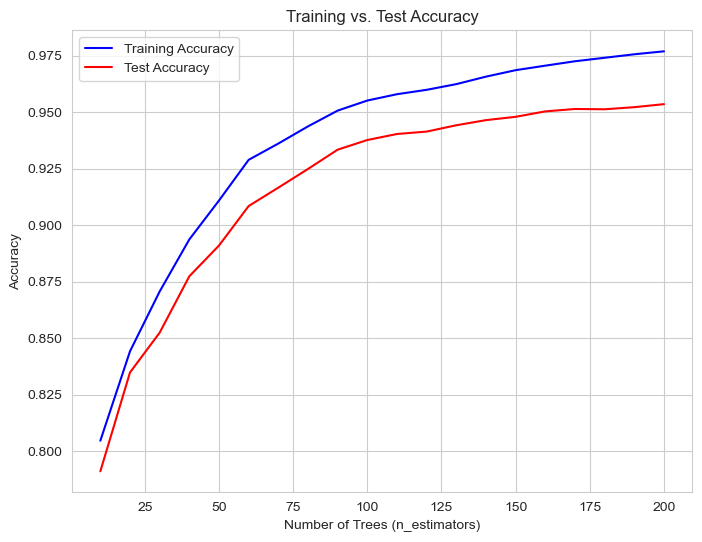

In [112]:
n_estimators = np.arange(10, 210, 10)
train_accuracies = []
test_accuracies = []
for n in n_estimators:
    model = lgb.LGBMClassifier(n_estimators=n, class_weight='balanced', random_state=1, max_depth=5,reg_alpha=0.1,     # L1 Regularization
    reg_lambda=0.1)
    model.fit(X_train, y_train)
    
    train_acc = accuracy_score(y_train, model.predict(X_train))
    test_acc = accuracy_score(y_test, model.predict(X_test))
    
    train_accuracies.append(train_acc)
    test_accuracies.append(test_acc)


plt.figure(figsize=(8, 6))
plt.plot(n_estimators, train_accuracies, label="Training Accuracy", color="blue")
plt.plot(n_estimators, test_accuracies, label="Test Accuracy", color="red")
plt.xlabel("Number of Trees (n_estimators)")
plt.ylabel("Accuracy")
plt.title("Training vs. Test Accuracy")
plt.legend()
plt.grid(True)
plt.show()


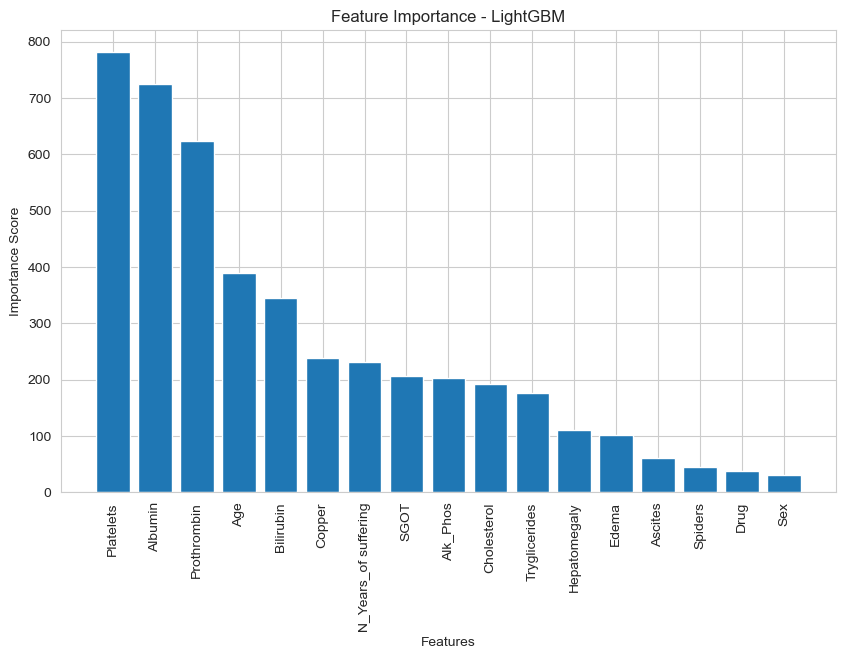

In [113]:
importance = lgb_model.feature_importances_
features = X_train.columns
indices = np.argsort(importance)[::-1]
plt.figure(figsize=(10, 6))
plt.title("Feature Importance - LightGBM")
plt.bar(range(len(features)), importance[indices], align="center")
plt.xticks(range(len(features)), features[indices], rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.show()

In [111]:
import pandas as pd
import numpy as np
import lightgbm as lgb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_curve
from imblearn.over_sampling import SMOTE

# 🔹 تحميل البيانات
m = df.drop('Stage', axis=1)
n = df['Stage']

# 🔹 تقسيم البيانات إلى تدريب واختبار
Xtrain, Xtest, Ytrain, Ytest = train_test_split(m, n, test_size=0.30, random_state=1)

# 🔹 تطبيق SMOTE لموازنة الفئات
sm = SMOTE(random_state=1)
Xtrain_res, Ytrain_res = sm.fit_resample(Xtrain, Ytrain)

# 🔹 ضبط scale_pos_weight لحل مشكلة عدم التوازن
scale_pos_weight = len(Ytrain[Ytrain == 0]) / len(Ytrain[Ytrain == 1])

# 🔹 إنشاء نموذج LightGBM مع المعلمات المحسنة
lgb_model = lgb.LGBMClassifier(
    scale_pos_weight=scale_pos_weight,  # موازنة الفئات
    random_state=1,
    n_estimators=200,  # عدد الأشجار
    max_depth=7,  # تقليل التعقيد
    learning_rate=0.05,  # معدل التعلم
    num_leaves=31,  # تعديل عدد الأوراق
    min_child_samples=50  # الحد الأدنى من العينات لكل ورقة
)

# 🔹 تدريب النموذج
lgb_model.fit(Xtrain_res, Ytrain_res)

# 🔹 التنبؤ باحتمالات الفئة 1
y_probs = lgb_model.predict_proba(Xtest)[:, 1]

# 🔹 تحديد العتبة المثلى باستخدام AUC-ROC
fpr, tpr, thresholds = roc_curve(Ytest, y_probs)
optimal_idx = np.argmax(tpr - fpr)  # إيجاد أفضل نقطة توازن
optimal_threshold = thresholds[optimal_idx]

print(f"🔹 Optimal Threshold Found: {optimal_threshold:.3f}")

# 🔹 ضبط التنبؤات باستخدام العتبة المثلى
y_preds_adjusted = (y_probs >= optimal_threshold).astype(int)

# 🔹 حساب مقاييس التقييم
accuracy = accuracy_score(Ytest, y_preds_adjusted)
precision = precision_score(Ytest, y_preds_adjusted)
recall = recall_score(Ytest, y_preds_adjusted)
f1 = f1_score(Ytest, y_preds_adjusted)

# 🔹 طباعة النتائج
print("\n🔹 LightGBM Performance with Optimized Threshold 🔹")
print(f"Test Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print("Confusion Matrix:\n", confusion_matrix(Ytest, y_preds_adjusted))
train_accuracy = accuracy_score(Ytrain_res, lgb_model.predict(Xtrain_res))

# حساب دقة الاختبار
test_accuracy = accuracy_score(Ytest, lgb_model.predict(Xtest))

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# 🔹 حساب Cross-validation
lgb_cv_scores = cross_val_score(lgb_model, Xtrain_res, Ytrain_res, cv=5, scoring='accuracy')
print("\n🔹 LightGBM Cross-validation scores:", lgb_cv_scores)
print("أفضل نموذج LightGBM Classification Report:\n", classification_report(Ytest,y_preds_adjusted))
# 🔹 رسم النتائج
plt.figure(figsize=(12, 6))

# 🔹 رسم منحنى AUC-ROC
plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, label=f'AUC-ROC Curve')
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], color='red', label='Optimal Threshold', zorder=3)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend()

# 🔹 رسم دقة الاختبار بعد ضبط العتبة
plt.subplot(1, 2, 2)
plt.bar(['LightGBM'], [accuracy])
plt.ylabel('Test Accuracy')
plt.title('Model Accuracy after Optimization')

plt.tight_layout()
plt.show()


ValueError: multiclass format is not supported


 LightGBM Performance for Multi-Class Classification 🔹
Test Accuracy: 0.9488
Precision: 0.9489
Recall: 0.9488
F1-Score: 0.9488
Confusion Matrix:
 [[2282  110   40]
 [  82 2468   46]
 [  40   66 2366]]
Training Accuracy: 0.9683
Test Accuracy: 0.9488

 LightGBM Cross-validation scores: [0.94781865 0.94895922 0.94838894 0.95437696 0.95380667]

lightGBM Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.94      0.94      2432
           1       0.93      0.95      0.94      2596
           2       0.96      0.96      0.96      2472

    accuracy                           0.95      7500
   macro avg       0.95      0.95      0.95      7500
weighted avg       0.95      0.95      0.95      7500



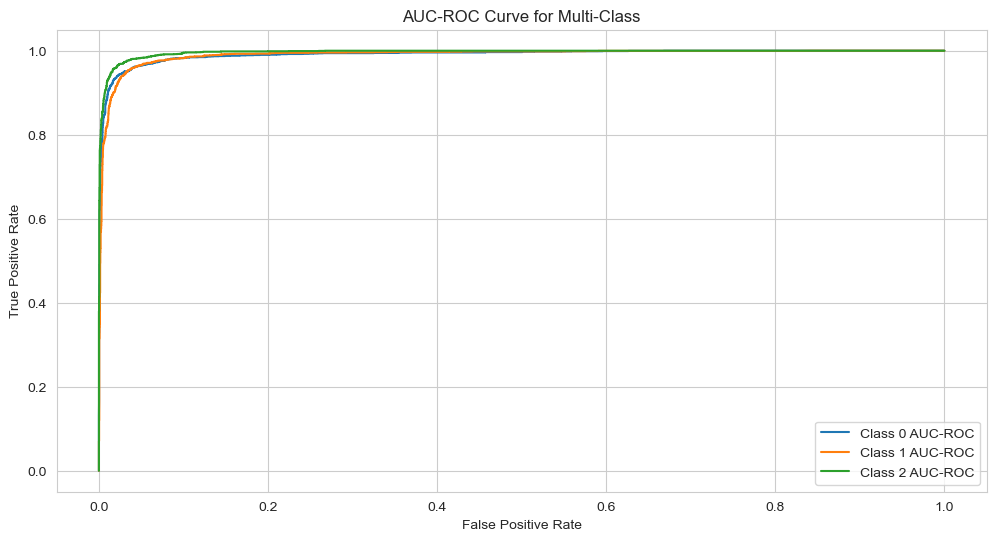

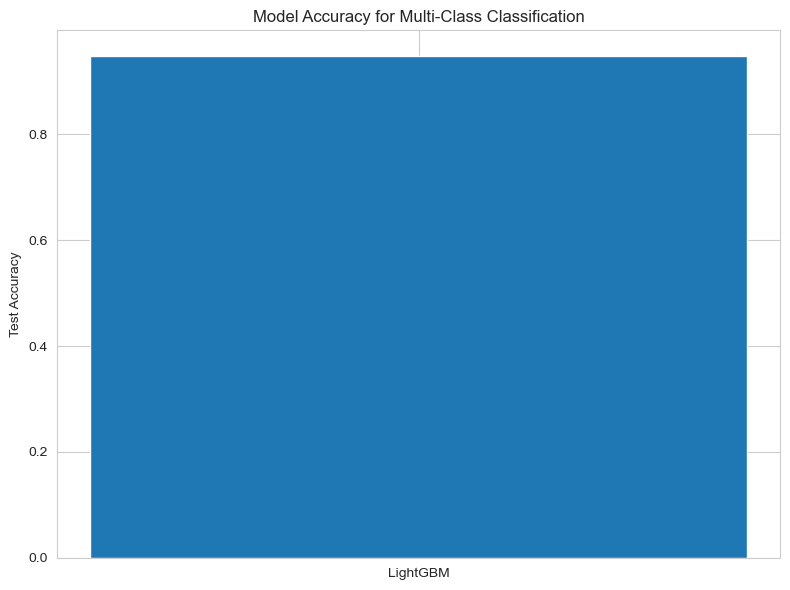

In [ ]:
# كويس اوي
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, classification_report
from imblearn.over_sampling import SMOTE
Xtrain, Xtest, Ytrain, Ytest = train_test_split(X, y, test_size=0.30, random_state=1)

sm = SMOTE(random_state=1)
Xtrain_res, Ytrain_res = sm.fit_resample(Xtrain, Ytrain)

lgb_model = lgb.LGBMClassifier(
    random_state=1,
    n_estimators=200,  
    max_depth=7,  
    learning_rate=0.05,  
    num_leaves=31,  
    min_child_samples=50,  
    objective='multiclass',  
    num_class=len(np.unique(Ytrain_res))  
)

lgb_model.fit(Xtrain_res, Ytrain_res)
y_probs = lgb_model.predict_proba(Xtest)
y_preds_adjusted = np.argmax(y_probs, axis=1)


accuracy = accuracy_score(Ytest, y_preds_adjusted)
precision = precision_score(Ytest, y_preds_adjusted, average='weighted')  
recall = recall_score(Ytest, y_preds_adjusted, average='weighted')  
f1 = f1_score(Ytest, y_preds_adjusted, average='weighted')  

print("\n LightGBM Performance for Multi-Class Classification ")
print(f"Test Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")
print("Confusion Matrix:\n", confusion_matrix(Ytest, y_preds_adjusted))

train_accuracy = accuracy_score(Ytrain_res, lgb_model.predict(Xtrain_res))
test_accuracy = accuracy_score(Ytest, lgb_model.predict(Xtest))
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")


lgb_cv_scores = cross_val_score(lgb_model, Xtrain_res, Ytrain_res, cv=5, scoring='accuracy')
print("\n LightGBM Cross-validation scores:", lgb_cv_scores)
print("\nlightGBM Classification Report:\n", classification_report(Ytest, y_preds_adjusted))


plt.figure(figsize=(12, 6))


for i in range(len(np.unique(Ytrain_res))):
    fpr, tpr, _ = roc_curve(Ytest, y_probs[:, i], pos_label=i)
    plt.plot(fpr, tpr, label=f'Class {i} AUC-ROC')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve for Multi-Class')
plt.legend()


plt.figure(figsize=(8, 6))
plt.bar(['LightGBM'], [accuracy])
plt.ylabel('Test Accuracy')
plt.title('Model Accuracy for Multi-Class Classification')

plt.tight_layout()
plt.show()


In [121]:
#first try 
gbm = GradientBoostingClassifier(random_state=1)
gbm.fit(X_train, y_train)
gbm_predict = gbm.predict(X_test)
print("Gradient Boosting Test Accuracy:", accuracy_score(y_test, gbm_predict))
gbm_train_acc = accuracy_score(y_train, gbm.predict(X_train))
gbm_test_acc = accuracy_score(y_test, gbm_predict)

# طباعة النتائج
print(f"Gradient Boosting Training Accuracy: {gbm_train_acc:.4f}")
print(f"Gradient Boosting Test Accuracy: {gbm_test_acc:.4f}")
print("Confusion Matrix:\n", confusion_matrix(y_test, gbm_predict))
print("Classification Report:\n", classification_report(y_test, gbm_predict))

Gradient Boosting Test Accuracy: 0.8409333333333333
Gradient Boosting Training Accuracy: 0.8584
Gradient Boosting Test Accuracy: 0.8409
Confusion Matrix:
 [[2000  340   92]
 [ 253 2156  187]
 [ 121  200 2151]]
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.82      0.83      2432
           1       0.80      0.83      0.81      2596
           2       0.89      0.87      0.88      2472

    accuracy                           0.84      7500
   macro avg       0.84      0.84      0.84      7500
weighted avg       0.84      0.84      0.84      7500



In [122]:
gbm = GradientBoostingClassifier( learning_rate=0.01, 
    n_estimators=500,  
    max_depth=3,  
    min_samples_split=20,  
    min_samples_leaf=10,  
    subsample=0.8,  
    random_state=1)

gbm.fit(X_train, y_train)

gbm_predict = gbm.predict(X_test)

print("Gradient Boosting Test Accuracy:", accuracy_score(y_test, gbm_predict))
gbm_train_acc = accuracy_score(y_train, gbm.predict(X_train))
gbm_test_acc = accuracy_score(y_test, gbm_predict)


print(f"Gradient Boosting Training Accuracy: {gbm_train_acc:.4f}")
print(f"Gradient Boosting Test Accuracy: {gbm_test_acc:.4f}")
print("Confusion Matrix:\n", confusion_matrix(y_test, gbm_predict))
print("Classification Report:\n", classification_report(y_test, gbm_predict))

Gradient Boosting Test Accuracy: 0.7956
Gradient Boosting Training Accuracy: 0.8021
Gradient Boosting Test Accuracy: 0.7956
Confusion Matrix:
 [[1919  412  101]
 [ 332 2008  256]
 [ 131  301 2040]]
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.79      0.80      2432
           1       0.74      0.77      0.76      2596
           2       0.85      0.83      0.84      2472

    accuracy                           0.80      7500
   macro avg       0.80      0.80      0.80      7500
weighted avg       0.80      0.80      0.80      7500



In [ ]:
n_estimators_range = np.arange(10, 210, 10)

train_acc = []
test_acc = []

for n in n_estimators_range:
    gbm = GradientBoostingClassifier(n_estimators=n, learning_rate=0.05, max_depth=4, random_state=1)
    gbm.fit(X_train, y_train)
    
    train_acc.append(accuracy_score(y_train, gbm.predict(X_train)))  # تدريب
    test_acc.append(accuracy_score(y_test, gbm.predict(X_test)))  # اختبار


plt.figure(figsize=(8, 6))
plt.plot(n_estimators_range, train_acc, label="Training Accuracy", color='blue')
plt.plot(n_estimators_range, test_acc, label="Test Accuracy", color='red')
plt.xlabel("Number of Trees (n_estimators)")
plt.ylabel("Accuracy")
plt.title("Training vs. Test Accuracy")
plt.legend()
plt.show()


In [ ]:

importance = gbm.feature_importances_
features = X_train.columns


indices = np.argsort(importance)[::-1]


plt.figure(figsize=(10, 6))
plt.title("Feature Importance - Gradient Boosting")
plt.bar(range(len(features)), importance[indices], align="center")
plt.xticks(range(len(features)), features[indices], rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance Score")
plt.show()


In [ ]:
# from sklearn.ensemble import GradientBoostingClassifier
# from sklearn.model_selection import train_test_split, GridSearchCV
# from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
# from imblearn.over_sampling import SMOTE
# import pandas as pd

# # تقسيم البيانات
# X = df.drop('diabetes', axis=1)
# y = df['diabetes']

# # تقسيم البيانات إلى تدريب واختبار
# Xtrain, Xtest, Ytrain, Ytest = train_test_split(X, y, test_size=0.30, random_state=1)

# # تطبيق SMOTE لزيادة بيانات الفئة الأقل
# smote = SMOTE(random_state=1)
# Xtrain_res, Ytrain_res = smote.fit_resample(Xtrain, Ytrain)

# # 1️⃣ نموذج Gradient Boosting مع تحسين المعلمات
# gbm = GradientBoostingClassifier(random_state=1)

# # تحديد معلمات الشبكة لتحسينها باستخدام GridSearchCV
# param_grid = {
#     'n_estimators': [50, 100, 150],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'max_depth': [3, 5, 7]
# }

# grid_search = GridSearchCV(estimator=gbm, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1)
# grid_search.fit(Xtrain_res, Ytrain_res)

# # أفضل معلمات
# best_params = grid_search.best_params_
# print("أفضل معلمات Gradient Boosting:", best_params)

# # تدريب النموذج باستخدام أفضل المعلمات
# best_gbm = grid_search.best_estimator_
# best_gbm.fit(Xtrain_res, Ytrain_res)

# # التنبؤ على بيانات الاختبار
# gbm_predict = best_gbm.predict(Xtest)

# # حساب الدقة والمقاييس الأخرى
# gbm_test_acc = accuracy_score(Ytest, gbm_predict)
# gbm_precision = precision_score(Ytest, gbm_predict)
# gbm_recall = recall_score(Ytest, gbm_predict)
# gbm_f1 = f1_score(Ytest, gbm_predict)
# conf_matrix = confusion_matrix(Ytest, gbm_predict)

# # طباعة النتائج
# print("Gradient Boosting Test Accuracy:", gbm_test_acc)
# print("Precision:", gbm_precision)
# print("Recall:", gbm_recall)
# print("F1-Score:", gbm_f1)
# print("Confusion Matrix:\n", conf_matrix)
# print("Classification Report:\n", classification_report(y_test, y_pred))


In [212]:
model = SVC()  

model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("SVM Training Accuracy:", train_accuracy)
print("SVM Test Accuracy:", test_accuracy)
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_test_pred))
print("\nClassification Report:\n", classification_report(y_test, y_test_pred))
accuracy = accuracy_score(y_test, y_pred)
accuracy

SVM Training Accuracy: 0.985134807518087
SVM Test Accuracy: 0.9847904863982034

Confusion Matrix:
 [[17863    30]
 [  268  1432]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99     17893
           1       0.98      0.84      0.91      1700

    accuracy                           0.98     19593
   macro avg       0.98      0.92      0.95     19593
weighted avg       0.98      0.98      0.98     19593



0.9204818047261777

In [ ]:
#stop here
train_sizes = np.linspace(0.1, 1.0, 10)  
train_acc = []
test_acc = []


for size in train_sizes:
    X_train_subset, _, y_train_subset, _ = train_test_split(X_train, y_train, train_size=size, random_state=42)
    
    model = SVC()
    model.fit(X_train_subset, y_train_subset)

    train_acc.append(accuracy_score(y_train_subset, model.predict(X_train_subset)))
    test_acc.append(accuracy_score(y_test, model.predict(X_test)))


plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_acc, label='Training Accuracy', color='blue')
plt.plot(train_sizes, test_acc, label='Test Accuracy', color='red')
plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Overfitting Analysis for SVM')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# from sklearn.svm import SVC
# from sklearn.model_selection import RandomizedSearchCV
# from imblearn.over_sampling import SMOTE
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import accuracy_score

# # تقسيم البيانات
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # توحيد البيانات باستخدام StandardScaler
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# # تطبيق SMOTE لموازنة البيانات
# smote = SMOTE(random_state=42)
# X_train_res, y_train_res = smote.fit_resample(X_train_scaled, y_train)

# # تحسين المعلمات باستخدام RandomizedSearchCV لتقليل الوقت
# param_dist = {
#     'C': [0.1, 1, 10],
#     'kernel': ['linear', 'rbf'],
#     'gamma': ['scale', 'auto']
# }

# random_search = RandomizedSearchCV(SVC(), param_distributions=param_dist, n_iter=5, cv=3, n_jobs=-1, verbose=1)
# random_search.fit(X_train_res, y_train_res)

# # أفضل معلمات
# best_params = random_search.best_params_
# print(f"أفضل معلمات SVM: {best_params}")

# # تدريب النموذج باستخدام أفضل المعلمات
# best_svm = random_search.best_estimator_
# best_svm.fit(X_train_res, y_train_res)

# # التنبؤ على بيانات الاختبار
# y_pred = best_svm.predict(X_test_scaled)

# # حساب الدقة
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Test Accuracy: {accuracy:.4f}")


In [ ]:
# from sklearn.svm import SVC
# from imblearn.over_sampling import SMOTE
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import accuracy_score
# from sklearn.model_selection import train_test_split

# # تقسيم البيانات
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # توحيد البيانات باستخدام StandardScaler
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# # تطبيق SMOTE لموازنة البيانات
# smote = SMOTE(random_state=42)
# X_train_res, y_train_res = smote.fit_resample(X_train_scaled, y_train)

# # إنشاء نموذج SVM مباشرة
# svm_model = SVC(kernel='rbf', C=1, gamma='scale')  # اختيارات معقولة بدون تحسين معلمات

# # تدريب النموذج
# svm_model.fit(X_train_res, y_train_res)

# # التنبؤ على بيانات الاختبار
# y_pred = svm_model.predict(X_test_scaled)

# # حساب الدقة
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Test Accuracy: {accuracy:.4f}")


In [83]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# إنشاء نموذج Naive Bayes
nb_model = GaussianNB()

# تدريب النموذج
nb_model.fit(X_train, y_train)

# التنبؤ
y_pred = nb_model.predict(X_test)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"Naive Bayes Test Accuracy: {accuracy:.4f}")

# طباعة مصفوفة التشويش
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Naive Bayes Test Accuracy: 0.7023
Confusion Matrix:
 [[8486 2389]
 [3139 4557]]


In [236]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# إنشاء نموذج MLP (Multi-layer Perceptron)
mlp_model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)

# تدريب النموذج
mlp_model.fit(X_train, y_train)

# التنبؤ
y_pred = mlp_model.predict(X_test)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"MLPClassifier Test Accuracy: {accuracy:.4f}")

# طباعة مصفوفة التشويش
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


MLPClassifier Test Accuracy: 0.7044
Confusion Matrix:
 [[1682  332]
 [ 407   79]]


c:\Users\arwah\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.



In [85]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# توحيد البيانات باستخدام StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# تطبيق SMOTE لموازنة البيانات
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train_scaled, y_train)

# معلمات بسيطة لـ RandomizedSearchCV
param_dist = {
    'hidden_layer_sizes': [(50,), (100,)],  # تقليل الخيارات
    'activation': ['relu'],  # استخدم تنشيط واحد
    'solver': ['adam'],  # استخدم خوارزمية واحدة
    'learning_rate': ['constant'],  # استخدم خيار واحد
    'max_iter': [1000],  # استخدم عدد التكرارات الثابت
    'alpha': [0.0001]  # تقليل المعامل المنتظم
}

# ضبط المعلمات عشوائيًا
random_search = RandomizedSearchCV(MLPClassifier(), param_distributions=param_dist, n_iter=3, cv=3, n_jobs=-1, verbose=1, random_state=42)
random_search.fit(X_train_res, y_train_res)

# أفضل معلمات
best_params = random_search.best_params_
print(f"أفضل معلمات MLPClassifier: {best_params}")

# تدريب النموذج باستخدام أفضل المعلمات
best_mlp = random_search.best_estimator_
best_mlp.fit(X_train_res, y_train_res)

# التنبؤ على بيانات الاختبار
y_pred = best_mlp.predict(X_test_scaled)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")


c:\Users\arwah\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 2 is smaller than n_iter=3. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 3 folds for each of 2 candidates, totalling 6 fits
أفضل معلمات MLPClassifier: {'solver': 'adam', 'max_iter': 1000, 'learning_rate': 'constant', 'hidden_layer_sizes': (50,), 'alpha': 0.0001, 'activation': 'relu'}
Test Accuracy: 0.7090


In [87]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# تطبيق SMOTE لموازنة البيانات
smote = SMOTE(sampling_strategy='auto', random_state=42, k_neighbors=5)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# إنشاء النموذج
mlp = MLPClassifier(solver='adam', max_iter=500, learning_rate='constant', 
                    hidden_layer_sizes=(50,), alpha=0.0001, activation='relu')

# تدريب النموذج
mlp.fit(X_train_res, y_train_res)

# التنبؤ على بيانات الاختبار
y_pred = mlp.predict(X_test)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Test Accuracy: 0.7056
Confusion Matrix:
 [[7235 3640]
 [1828 5868]]


In [86]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# إنشاء نموذج CatBoost
catboost_model = CatBoostClassifier(iterations=500, learning_rate=0.1, depth=6, random_state=42, verbose=0)

# تدريب النموذج
catboost_model.fit(X_train, y_train)

# التنبؤ
y_pred = catboost_model.predict(X_test)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"CatBoost Test Accuracy: {accuracy:.4f}")

# طباعة مصفوفة التشويش
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


CatBoost Test Accuracy: 0.7171
Confusion Matrix:
 [[8101 2774]
 [2479 5217]]


In [89]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# إنشاء نموذج CatBoost مع معلمات مختلفة
model = CatBoostClassifier(iterations=1000, learning_rate=0.05, depth=10, cat_features=[], random_seed=42, verbose=200)

# تدريب النموذج
model.fit(X_train, y_train)

# التنبؤ على بيانات الاختبار
y_pred = model.predict(X_test)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


0:	learn: 0.6735144	total: 27.5ms	remaining: 27.5s


KeyboardInterrupt: 

In [95]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# توحيد البيانات باستخدام StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# تطبيق SMOTE لموازنة البيانات
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train_scaled, y_train)

# تحسين المعلمات باستخدام GridSearchCV
param_grid = {
    'iterations': [400,500],  # عدد التكرارات
    'depth': [5, 7],  # عمق الشجرة
    'learning_rate': [0.05, 0.1],  # معدل التعلم
}

grid_search = GridSearchCV(CatBoostClassifier(silent=True), param_grid, cv=3, n_jobs=-1, verbose=1)
grid_search.fit(X_train_res, y_train_res)

# أفضل معلمات
best_params = grid_search.best_params_
print(f"أفضل معلمات CatBoost: {best_params}")

# تدريب النموذج باستخدام أفضل المعلمات
best_catboost = grid_search.best_estimator_
best_catboost.fit(X_train_res, y_train_res)

# التنبؤ على بيانات الاختبار
y_pred = best_catboost.predict(X_test_scaled)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")


Fitting 3 folds for each of 8 candidates, totalling 24 fits
أفضل معلمات CatBoost: {'depth': 5, 'iterations': 400, 'learning_rate': 0.05}
Test Accuracy: 0.7252


In [93]:
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# توحيد البيانات
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# تطبيق SMOTE لموازنة البيانات
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train_scaled, y_train)

# تعريف نماذج التصنيف
catboost_model = CatBoostClassifier(iterations=100, depth=7, learning_rate=0.05, verbose=0)
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# دمج النماذج في VotingClassifier
voting_clf = VotingClassifier(estimators=[('catboost', catboost_model), ('rf', rf_model)], voting='soft')

# تدريب النموذج المدمج
voting_clf.fit(X_train_res, y_train_res)

# التنبؤ على بيانات الاختبار
y_pred = voting_clf.predict(X_test_scaled)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")


Test Accuracy: 0.7226


In [90]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# توحيد البيانات باستخدام StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# تطبيق SMOTE لموازنة البيانات
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train_scaled, y_train)

# تحسين المعلمات باستخدام GridSearchCV
param_grid = {
    'hidden_layer_sizes': [(50,), (100,)],  # تقليل الخيارات
    'max_iter': [200, 300],  # تقليل عدد التكرارات
    'learning_rate': ['constant'],  # استخدام خيار واحد فقط
    'alpha': [0.0001, 0.001],  # تقليل النطاق
    'solver': ['adam'],
    'activation': ['relu']
}

grid_search = GridSearchCV(MLPClassifier(), param_grid, cv=3, n_jobs=-1, verbose=1)
grid_search.fit(X_train_res, y_train_res)

# أفضل معلمات
best_params = grid_search.best_params_
print(f"أفضل معلمات MLPClassifier: {best_params}")

# تدريب النموذج باستخدام أفضل المعلمات
best_mlp = grid_search.best_estimator_
best_mlp.fit(X_train_res, y_train_res)

# التنبؤ على بيانات الاختبار
y_pred = best_mlp.predict(X_test_scaled)

# حساب الدقة
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")


Fitting 3 folds for each of 8 candidates, totalling 24 fits
أفضل معلمات MLPClassifier: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (50,), 'learning_rate': 'constant', 'max_iter': 300, 'solver': 'adam'}
Test Accuracy: 0.7044


In [20]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif

In [21]:
# تحميل البيانات
X = df.drop('Alzheimer risk', axis=1)
y = df['Alzheimer risk']

# تقسيم البيانات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [22]:
# تحسين SMOTE لزيادة العينات من الفئة 1
smote = SMOTE(sampling_strategy=1, random_state=42)  # زيادة نسبة موازنة الفئات
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [23]:
# 1. زيادة عدد الأشجار
rf = BalancedRandomForestClassifier(n_estimators=300, random_state=42, max_depth=7)
rf.fit(X_train_resampled, y_train_resampled)

c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.
  warn(


BalancedRandomForestClassifier(max_depth=7, n_estimators=300, random_state=42)

In [24]:
# 2. ضبط max_depth إلى 10 أو 15
rf = BalancedRandomForestClassifier(n_estimators=200, random_state=42, max_depth=10)
rf.fit(X_train_resampled, y_train_resampled)

c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.
  warn(


BalancedRandomForestClassifier(max_depth=10, n_estimators=200, random_state=42)

In [25]:
# 3. استخدام Grid Search لتحديد المعلمات المثلى
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}
grid_search = GridSearchCV(estimator=BalancedRandomForestClassifier(random_state=42),
                           param_grid=param_grid, cv=5, verbose=2, n_jobs=-1)
grid_search.fit(X_train_resampled, y_train_resampled)
best_rf = grid_search.best_estimator_


Fitting 5 folds for each of 72 candidates, totalling 360 fits


KeyboardInterrupt: 

In [27]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_dist = {
    'n_estimators': randint(100, 200),  # تقليل النطاق من 300 إلى 200
    'max_depth': randint(5, 10),  # تقليل النطاق من 15 إلى 10
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

# تقليل عدد التراكيب إلى 20 بدلاً من 50
random_search = RandomizedSearchCV(estimator=BalancedRandomForestClassifier(random_state=42),
                                   param_distributions=param_dist, n_iter=20, cv=3, verbose=2, n_jobs=-1)
random_search.fit(X_train_resampled, y_train_resampled)
best_rf = random_search.best_estimator_




Fitting 3 folds for each of 20 candidates, totalling 60 fits


c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(


In [29]:
# 4. زيادة توازن الفئات باستخدام SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)  # زيادة نسبة موازنة الفئات
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [30]:
# تدريب النموذج
rf = BalancedRandomForestClassifier(n_estimators=200, random_state=42, max_depth=7)
rf.fit(X_train_resampled, y_train_resampled)

c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.
  warn(


BalancedRandomForestClassifier(max_depth=7, n_estimators=200, random_state=42)

In [31]:
# 5. ضبط وزن الفئات
rf = BalancedRandomForestClassifier(n_estimators=200, random_state=42, max_depth=7, class_weight='balanced')
rf.fit(X_train_resampled, y_train_resampled)


c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.
  warn(


BalancedRandomForestClassifier(class_weight='balanced', max_depth=7,
                               n_estimators=200, random_state=42)

In [33]:
# 6. تقليص الأبعاد باستخدام PCA (اختياري)
pca = PCA(n_components=.5)
X_train_pca = pca.fit_transform(X_train_resampled)
X_test_pca = pca.transform(X_test)

In [34]:
rf = BalancedRandomForestClassifier(n_estimators=200, random_state=42, max_depth=7)
rf.fit(X_train_pca, y_train_resampled)

c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.
  warn(


BalancedRandomForestClassifier(max_depth=7, n_estimators=200, random_state=42)

In [35]:
# 7. Feature Selection باستخدام SelectKBest
selector = SelectKBest(f_classif, k=10)
X_train_selected = selector.fit_transform(X_train_resampled, y_train_resampled)
X_test_selected = selector.transform(X_test)

In [36]:
rf = BalancedRandomForestClassifier(n_estimators=200, random_state=42, max_depth=7)
rf.fit(X_train_selected, y_train_resampled)

c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.
  warn(


BalancedRandomForestClassifier(max_depth=7, n_estimators=200, random_state=42)

In [37]:
# تقييم النموذج
y_pred_rf = rf.predict(X_test)
print("Balanced Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("Balanced Random Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))

# استخدام المعلمات المثلى من GridSearchCV
y_pred_rf = best_rf.predict(X_test)
print("Balanced Random Forest (Grid Search) Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("Balanced Random Forest (Grid Search) Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))


c:\Users\arwah\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but BalancedRandomForestClassifier was fitted without feature names
  warnings.warn(


ValueError: X has 24 features, but BalancedRandomForestClassifier is expecting 10 features as input.

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# التأكد من أن الأعمدة في X_train و X_test هي نفسها
X_train, X_test = X_train.align(X_test, join='inner', axis=1)
# إذا استخدمت StandardScaler، تأكد من أنه يتم تدريبه على X_train فقط
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
print(X_train.shape)
print(X_test.shape)


(59426, 24)
(14857, 24)


In [41]:
print(X_train.shape)  # عدد السمات في بيانات التدريب
print(X_test.shape)   # عدد السمات في بيانات الاختبار


(59426, 24)
(14857, 24)


In [42]:
print(X_train_resampled.shape)  # تحقق من بيانات التدريب بعد تطبيق SMOTE


(69702, 24)


In [43]:
y_pred_rf = rf.predict(X_test)
print("Balanced Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("Balanced Random Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))


c:\Users\arwah\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but BalancedRandomForestClassifier was fitted without feature names
  warnings.warn(


ValueError: X has 24 features, but BalancedRandomForestClassifier is expecting 10 features as input.

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from imblearn.ensemble import BalancedRandomForestClassifier

# تقسيم البيانات
X = df.drop('Alzheimer risk', axis=1)
y = df['Alzheimer risk']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# استخدام SMOTE لزيادة توازن الفئات
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# استخدام Balanced Random Forest Classifier
rf = BalancedRandomForestClassifier(n_estimators=200, random_state=42, max_depth=7)

# تدريب النموذج على البيانات المعاد توازنها
rf.fit(X_train_resampled, y_train_resampled)

# تقييم النموذج
y_pred_rf = rf.predict(X_test)
print("Balanced Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("Balanced Random Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))


c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
c:\Users\arwah\anaconda3\Lib\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future behaviour.
  warn(


Balanced Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.74      0.76      8719
           1       0.65      0.71      0.68      6138

    accuracy                           0.73     14857
   macro avg       0.72      0.72      0.72     14857
weighted avg       0.73      0.73      0.73     14857

Balanced Random Forest Confusion Matrix:
[[6409 2310]
 [1765 4373]]


In [75]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from lightgbm import LGBMClassifier
from imblearn.over_sampling import SMOTE
import numpy as np

# تقسيم البيانات مع الحفاظ على توزيع الفئات
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# موازنة البيانات باستخدام SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# ضبط scale_pos_weight لموازنة الفئات
scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

# إنشاء وتدريب نموذج LightGBM
lgbm = LGBMClassifier(scale_pos_weight=scale_pos_weight, random_state=42)
lgbm.fit(X_train_resampled, y_train_resampled)

# توقع القيم الاحتمالية بدلاً من القيم الثنائية
y_probs = lgbm.predict_proba(X_test)[:, 1]  

# تحديد العتبة المثلى (بدلاً من 0.5)
threshold = 0.35  
y_pred = (y_probs >= threshold).astype(int)

# حساب الدقة والتقارير
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_probs)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# طباعة النتائج
print(f"🔹 LightGBM Test Accuracy: {accuracy:.4f}")
print(f"🔹 ROC-AUC Score: {roc_auc:.4f}")
print("🔹 Confusion Matrix:\n", conf_matrix)
print("🔹 Classification Report:\n", class_report)


🔹 LightGBM Test Accuracy: 0.3536
🔹 ROC-AUC Score: 0.5091
🔹 Confusion Matrix:
 [[ 379 1176]
 [  87  312]]
🔹 Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.24      0.38      1555
           1       0.21      0.78      0.33       399

    accuracy                           0.35      1954
   macro avg       0.51      0.51      0.35      1954
weighted avg       0.69      0.35      0.37      1954

